# Rainfall Prediction - Weather Forecasting

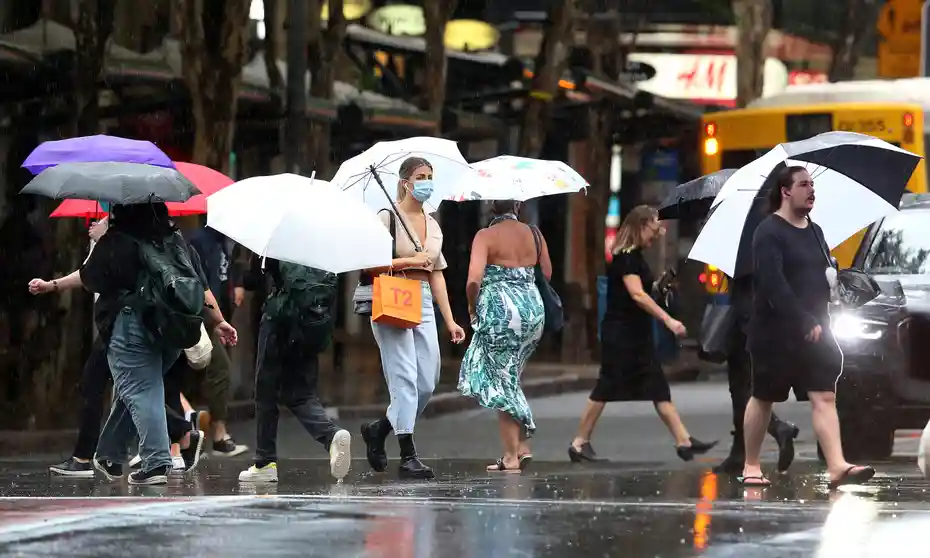

#### Weather forecasting is the application of science and technology to predict the conditions of the atmosphere for a given location and time. Weather forecasts are made by collecting quantitative data about the current state of the atmosphere at a given place and using meteorology to project how the atmosphere will change.

#### Rain Dataset is to predict whether or not it will rain tomorrow. The Dataset contains about 10 years of daily weather observations of different locations in Australia.

### 1. Problem Statement: 
a) Design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow.

b)  Design a predictive model with the use of machine learning algorithms to predict how much rainfall could be there.

### Dataset Description:

Number of columns: 23


Date  - The date of observation

Location  -The common name of the location of the weather station

MinTemp  -The minimum temperature in degrees celsius

MaxTemp -The maximum temperature in degrees celsius

Rainfall  -The amount of rainfall recorded for the day in mm

Evaporation  -The so-called Class A pan evaporation (mm) in the 24 hours to 9am

Sunshine  -The number of hours of bright sunshine in the day.

WindGustDi r- The direction of the strongest wind gust in the 24 hours to midnight

WindGustSpeed -The speed (km/h) of the strongest wind gust in the 24 hours to midnight

WindDir9am -Direction of the wind at 9am

WindDir3pm -Direction of the wind at 3pm

WindSpeed9am -Wind speed (km/hr) averaged over 10 minutes prior to 9am

WindSpeed3pm -Wind speed (km/hr) averaged over 10 minutes prior to 3pm

Humidity9am -Humidity (percent) at 9am

Humidity3pm -Humidity (percent) at 3pm

Pressure9am -Atmospheric pressure (hpa) reduced to mean sea level at 9am

Pressure3pm -Atmospheric pressure (hpa) reduced to mean sea level at 3pm

Cloud9am - Fraction of sky obscured by cloud at 9am. 

Cloud3pm -Fraction of sky obscured by cloud 

Temp9am-Temperature (degrees C) at 9am

Temp3pm -Temperature (degrees C) at 3pm

RainToday -Boolean: 1 if precipitation (mm) in the 24 hours to 9am exceeds 1mm, otherwise 0

RainTomorrow -The amount of next day rain in mm. Used to create response variable . A kind of measure of the "risk".



In [952]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

In [953]:
df = pd.read_csv("https://raw.githubusercontent.com/arjun0200/Datasets/main/weatherAUS.csv")
pd.set_option("max_rows", None)
pd.set_option("max_columns", None)

### Data Analysis

In [954]:
df.head(5)  # checking first rows of the dataset

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [955]:
df.tail(5)   # checking last rows of the dataset

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,ENE,13.0,11.0,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,N,13.0,9.0,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,N,13.0,7.0,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No
8424,2017-06-25,Uluru,14.9,NaN,0.0,NaN,NaN,NaN,NaN,ESE,ESE,17.0,17.0,62.0,36.0,1020.2,1017.9,8.0,8.0,15.0,20.9,No,NaN


In [956]:
df.sample(5)  # checking random rows of the dataset

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
6837,2014-09-25,Adelaide,13.9,16.9,0.0,3.8,NaN,WSW,31.0,SSW,SW,17.0,13.0,65.0,53.0,1023.0,1022.3,NaN,NaN,15.1,15.4,No,No
4865,2010-09-15,Melbourne,9.4,16.5,0.0,3.2,4.6,W,52.0,W,WSW,31.0,30.0,56.0,80.0,1014.3,1013.8,6.0,7.0,12.1,13.1,No,Yes
5781,2010-12-29,Melbourne,13.7,30.3,0.0,7.6,13.1,S,52.0,N,S,26.0,30.0,31.0,46.0,1013.1,1013.6,NaN,NaN,22.8,23.5,No,No
2887,2015-12-24,Williamtown,18.8,24.7,7.6,4.6,NaN,SSE,46.0,SE,ESE,19.0,28.0,59.0,60.0,1019.2,1018.0,7.0,7.0,22.8,22.9,Yes,No
7627,2012-11-22,PerthAirport,18.1,32.0,0.0,8.4,12.9,SW,39.0,NNW,W,11.0,22.0,42.0,42.0,1010.7,1007.5,4.0,2.0,28.0,28.0,No,No


In [957]:
df.shape # checking size of the dataset

(8425, 23)

### Checking Columns

In [958]:
df.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

### Checking Target Variables

No     6195
Yes    1991
Name: RainTomorrow, dtype: int64


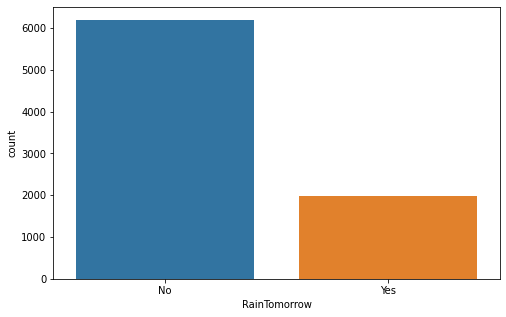

In [959]:
plt.figure(figsize = (8,5))
target = df.RainTomorrow.value_counts()
print(target)
target = sns.countplot(df.RainTomorrow)

#### Observations of the target variable
- From above RainTomorrow we can see that dataset are in imbalance count hence we need to fix it further for better performance model later

<AxesSubplot:ylabel='Density'>

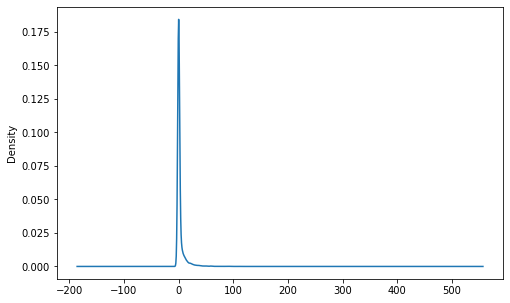

In [960]:
plt.figure(figsize = (8,5))
df.Rainfall.plot(kind = 'kde')

#### From above graph we find that most of the rainfall density are lies in the range of approx 0 to 0.175

In [961]:
df.dtypes  # checking datatypes of the train dataset

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

### Observations:
 - Date', 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm','RainToday', 'RainTomorrow' these columns are of **object types**.


 - 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine','WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am','Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm' these columns are of **numerical types.**

In [962]:
df.describe()  # checking overall summary of the dataset

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,8350.000000,8365.000000,8185.000000,4913.000000,4431.000000,7434.000000,8349.000000,8318.000000,8366.000000,8323.000000,7116.000000,7113.000000,6004.000000,5970.000000,8369.000000,8329.000000
mean,13.193305,23.859976,2.805913,5.389395,7.632205,40.174469,13.847646,18.533662,67.822496,51.249790,1017.640233,1015.236075,4.566622,4.503183,17.762015,22.442934
std,5.403596,6.136408,10.459379,5.044484,3.896235,14.665721,10.174579,9.766986,16.833283,18.423774,6.828699,6.766681,2.877658,2.731659,5.627035,5.980020
min,-2.000000,8.200000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000
25%,9.200000,19.300000,0.000000,2.600000,4.750000,30.000000,6.000000,11.000000,56.000000,39.000000,1013.000000,1010.400000,1.000000,2.000000,13.800000,18.000000
50%,13.300000,23.300000,0.000000,4.600000,8.700000,39.000000,13.000000,19.000000,68.000000,51.000000,1017.700000,1015.300000,5.000000,5.000000,17.800000,21.900000
75%,17.400000,28.000000,1.000000,7.000000,10.700000,50.000000,20.000000,24.000000,80.000000,63.000000,1022.300000,1019.800000,7.000000,7.000000,21.900000,26.400000
max,28.500000,45.500000,371.000000,145.000000,13.900000,107.000000,63.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000


### Checking Null Values of the Dataset

In [963]:
df.isnull().sum()/len(df)*100 # checking null values percentage of train dataset

Date              0.000000
Location          0.000000
MinTemp           0.890208
MaxTemp           0.712166
Rainfall          2.848665
Evaporation      41.685460
Sunshine         47.406528
WindGustDir      11.762611
WindGustSpeed    11.762611
WindDir9am        9.839763
WindDir3pm        3.655786
WindSpeed9am      0.902077
WindSpeed3pm      1.270030
Humidity9am       0.700297
Humidity3pm       1.210682
Pressure9am      15.537092
Pressure3pm      15.572700
Cloud9am         28.735905
Cloud3pm         29.139466
Temp9am           0.664688
Temp3pm           1.139466
RainToday         2.848665
RainTomorrow      2.836795
dtype: float64

### Exploratory Data Analysis

#### Extracting Date dataset's Important data

In [964]:
df['Month'] = pd.to_datetime(df['Date']).dt.month  

# extracting month only because we know that rain depend on month not on day ** date** 
# also we need to build a future prediction model hence year data also has no use.

In [965]:
# droping date after extracting important details
df.drop(["Date"], axis = 1, inplace = True)

In [966]:
df.head(1)

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Month
0,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No,12


### Dividing columns into object and numerical categories for easy understandings

In [967]:
df_object = df.select_dtypes(include = 'object').columns  # object dataset columns
df_num = df.select_dtypes(exclude = 'object').columns  # numerical dataset columns

### Dealing with NaN values

#### Numerical dataset

In [968]:
df[df_num].isnull().sum()

MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustSpeed     991
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
Month               0
dtype: int64

In [969]:
num = ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm']

#### Observations: We see that most of the columns dataset having Null values

### Checking dataset with Mean values

In [970]:
df_mean = pd.DataFrame()  # making new dataframe for checking
df_median = pd.DataFrame()

In [971]:
for i in num:
    df_mean[i] = df[i].fillna(df[i].mean())
    df_median[i] = df[i].fillna(df[i].median())

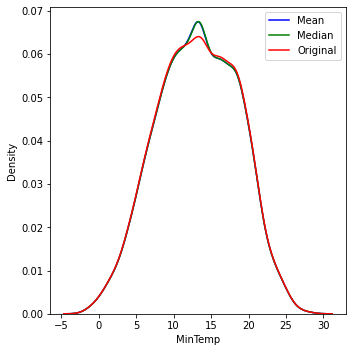

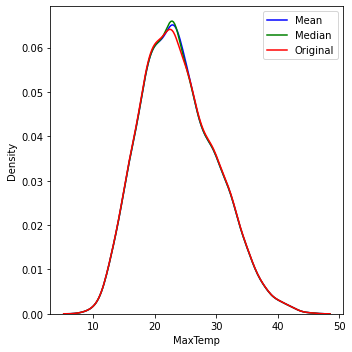

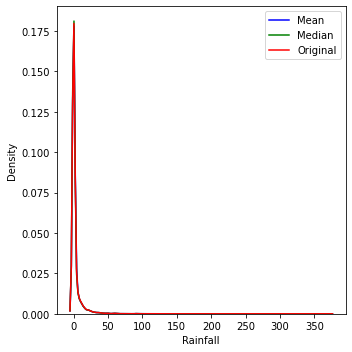

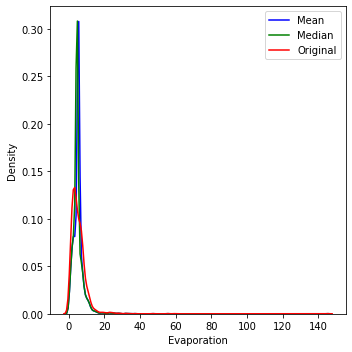

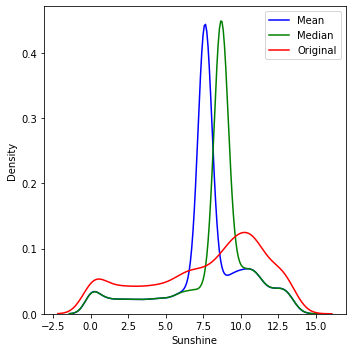

...

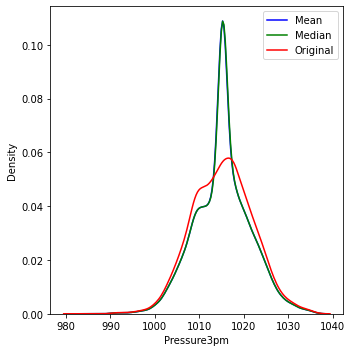

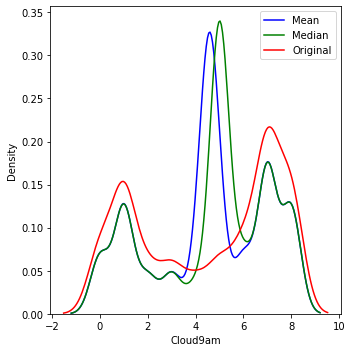

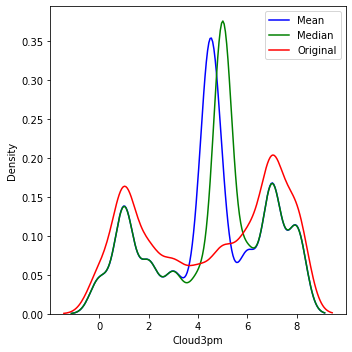

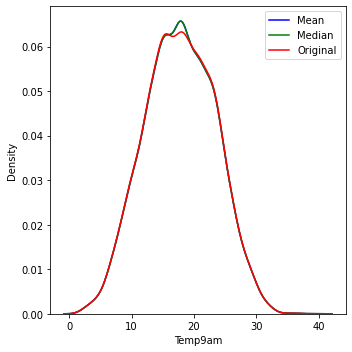

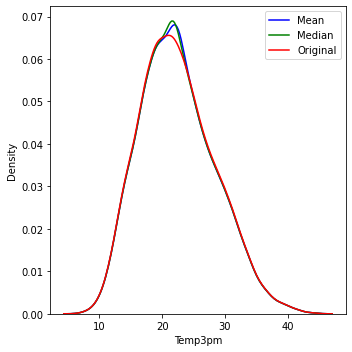

In [972]:
for i in num:    
    plt.figure(figsize = (5,5))
    sns.distplot(df_mean[i], bins = 20, hist = False, color = 'b', label = 'Mean' )
    sns.distplot(df_median[i], bins = 20, hist = False, color = 'g', label = 'Median')
    sns.distplot(df[i], bins = 20, hist = False, color = 'r', label = 'Original')
    plt.legend(labels=['Mean','Median', 'Original'])
    plt.tight_layout()

#### From above graphs we find that some of the dataset are close to Mean rather than Median hence we are going to imputations with mean.

In [973]:
for i in num:
    df[i] = df[i].fillna(df[i].mean())

#### Categorical dataset

In [974]:
object = ['WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday',
       'RainTomorrow']

### Checking unique values of the dataset

In [975]:
for i in object:
    print(i, "column having ", df[i].nunique(), "unique values", "\n")  # train dataset

WindGustDir column having  16 unique values 

WindDir9am column having  16 unique values 

WindDir3pm column having  16 unique values 

RainToday column having  2 unique values 

RainTomorrow column having  2 unique values 



### Filling NaN values with most frequent values by using CategoricalImputer

In [976]:
from sklearn_pandas import CategoricalImputer
 
imputer = CategoricalImputer()

for i in object:
    df[i] = imputer.fit_transform(df[i])

In [977]:
df.isnull().sum()  #checking overall null values

Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
Month            0
dtype: int64

<AxesSubplot:>

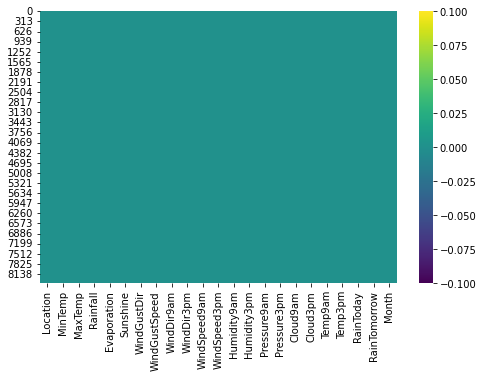

In [978]:
plt.figure(figsize = (8,5))
sns.heatmap(df.isnull(), cmap = 'viridis')

### Checking duplicated values

In [979]:
df.duplicated().sum() # duplicate values counts of the train dataset 

1672

### Dropping Duplicates Values

In [980]:
df.drop_duplicates(keep = 'first', inplace = True)   # dropping duplicate values for improved dataset 

### Object Dataset

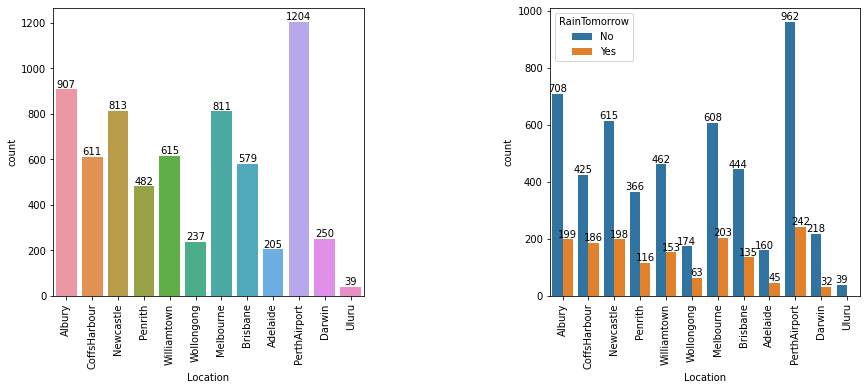

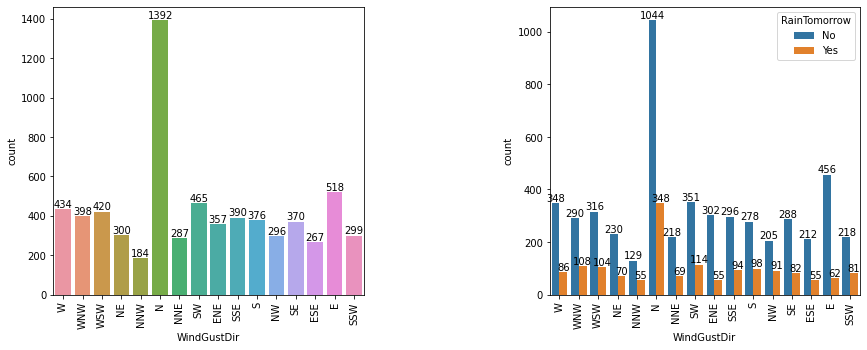

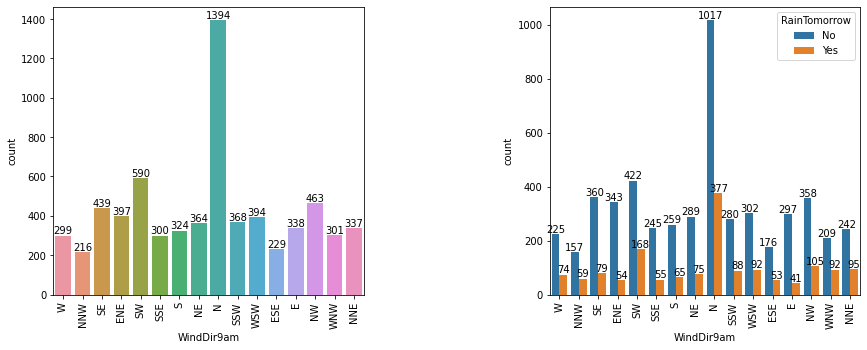

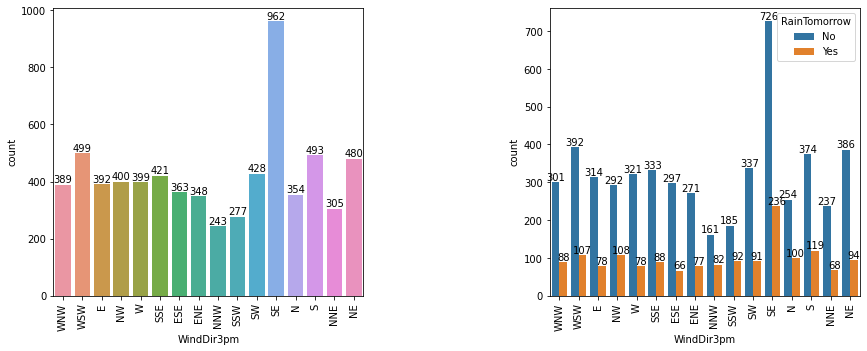

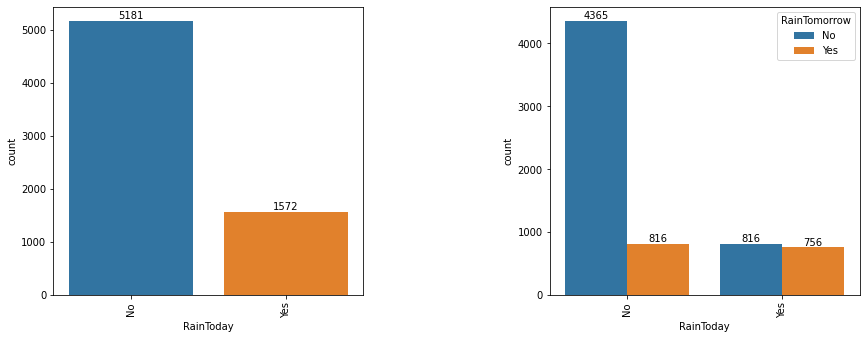

In [981]:
for i in df_object[:-1]:    
    plt.figure(figsize= (14, 5))
    l = list(df[i].unique())
    plt.subplot(1,2,1)
    bar = sns.countplot(df[i])
    bar.set_xticklabels(labels = l, rotation = 90)
    for j in bar.containers:
        bar.bar_label(j)

    
    plt.subplot(1,2,2)
    bar = sns.countplot(df[i], hue = df['RainTomorrow'])
    bar.set_xticklabels(labels = l, rotation = 90)
    for j in bar.containers:
        bar.bar_label(j)
    plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.6, 
                    hspace=0.6)

### Observations:

In [982]:
# Location      RainTomorrow  Counts
# Adelaide      No              160
#               Yes              45
# Albury        No              708
#               Yes             199
# Brisbane      No              444
#               Yes             135
# CoffsHarbour  No              425
#               Yes             186
# Darwin        No              218
#               Yes              32
# Melbourne     No              608
#               Yes             203
# Newcastle     No              615
#               Yes             198
# Penrith       No              366
#               Yes             116
# PerthAirport  No              962
#               Yes             242
# Uluru         No               39
# Williamtown   No              462
#               Yes             153
# Wollongong    No              174
#               Yes              63
 
# WindGustDir  RainTomorrow   Counts
# E            No               456
#              Yes               62
# ENE          No               302
#              Yes               55
# ESE          No               212
#              Yes               55
# N            No              1044
#              Yes              348
# NE           No               230
#              Yes               70
# NNE          No               218
#              Yes               69
# NNW          No               129
#              Yes               55
# NW           No               205
#              Yes               91
# S            No               278
#              Yes               98
# SE           No               288
#              Yes               82
# SSE          No               296
#              Yes               94
# SSW          No               218
#              Yes               81
# SW           No               351
#              Yes              114
# W            No               348
#              Yes               86
# WNW          No               290
#              Yes              108
# WSW          No               316
#              Yes              104

# WindDir9am  RainTomorrow    Counts
# E           No               297
#             Yes               41
# ENE         No               343
#             Yes               54
# ESE         No               176
#             Yes               53
# N           No              1017
#             Yes              377
# NE          No               289
#             Yes               75
# NNE         No               242
#             Yes               95
# NNW         No               157
#             Yes               59
# NW          No               358
#             Yes              105
# S           No               259
#             Yes               65
# SE          No               360
#             Yes               79
# SSE         No               245
#             Yes               55
# SSW         No               280
#             Yes               88
# SW          No               422
#             Yes              168
# W           No               225
#             Yes               74
# WNW         No               209
#             Yes               92
# WSW         No               302
#             Yes               92

# WindDir3pm  RainTomorrow    Counts
# E           No              314
#             Yes              78
# ENE         No              271
#             Yes              77
# ESE         No              297
#             Yes              66
# N           No              254
#             Yes             100
# NE          No              386
#             Yes              94
# NNE         No              237
#             Yes              68
# NNW         No              161
#             Yes              82
# NW          No              292
#             Yes             108
# S           No              374
#             Yes             119
# SE          No              726
#             Yes             236
# SSE         No              333
#             Yes              88
# SSW         No              185
#             Yes              92
# SW          No              337
#             Yes              91
# W           No              321
#             Yes              78
# WNW         No              301
#             Yes              88
# WSW         No              392
#             Yes             107

# RainToday  RainTomorrow    Counts
# No         No              4365
#            Yes              816
# Yes        No               816
#            Yes              756

# RainTomorrow  RainTomorrow   Counts
# No            No              5181
# Yes           Yes             1572


# Location: At PerthAirport the rainchanges for tomorrow are 242 which are higher from other locations.

# WindGustDir: When WindGustDir are higher N direction than chances of rain tomorrow is higher as per graph dataset.

# WindDir9am: When WindGustDir are higher N direction than chances of rain tomorrow is higher as per graph dataset.

# WindDir3apm: When WindGustDir are higher SE direction than chances of rain tomorrow is higher as per graph dataset.



### Pie Chart

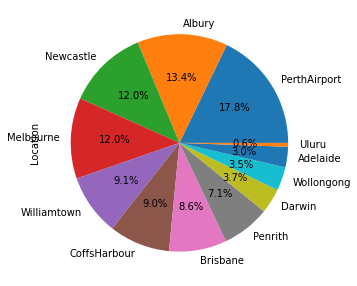

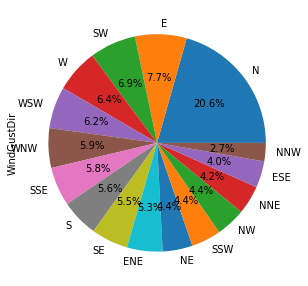

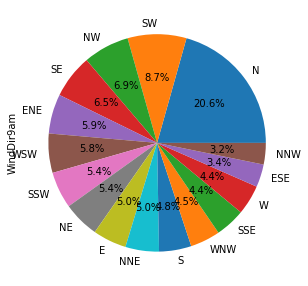

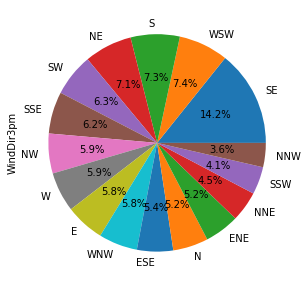

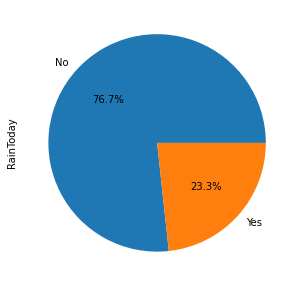

In [983]:
for i in df_object[:-1]:
    graph = df[i].value_counts()
    plt.figure(figsize = (5,5))
    graph.plot(kind = 'pie', autopct = '%1.1f%%')

### Observations:

- Location: PerthAirport having higher area rather than other locations.


- WindGustDir: WindGustDir are morer to the North Direction upto 20.6 ratio from whole dataset.


- WindDir9am : WindDir9am are also morer to the North as per dataset pie graph.


- WindDir3pm: WindDir3pm are changes to South East mostly as per dataset with ratio of 14.2.


### Numerical Dataset

### Boxplot

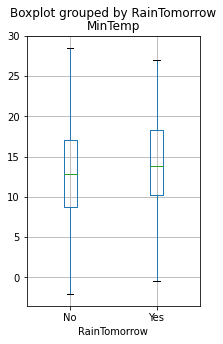

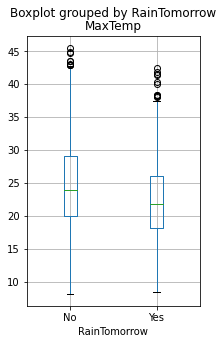

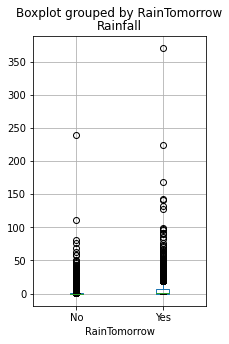

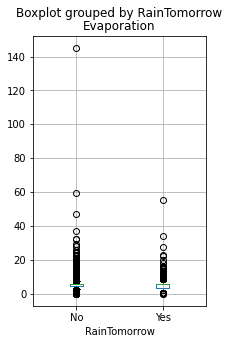

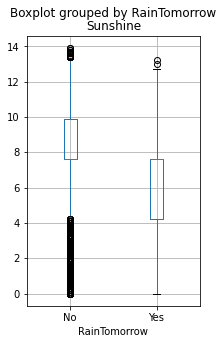

...

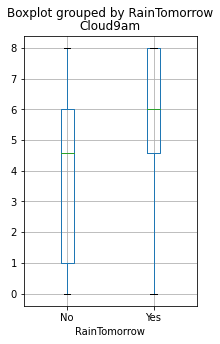

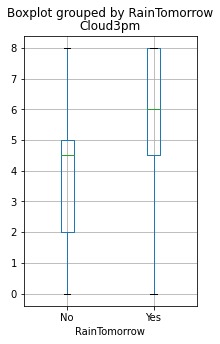

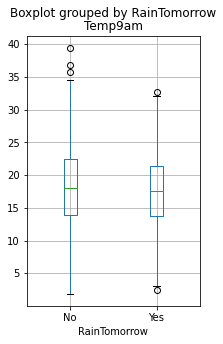

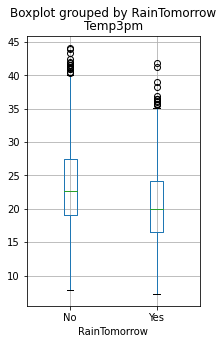

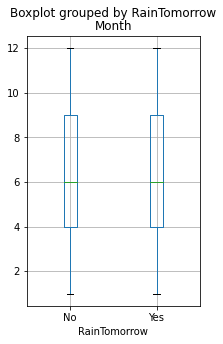

In [984]:
for i in df_num:    
    df.boxplot(column = i, by = 'RainTomorrow', figsize = (3,5))

#### From above graph we find that MaxTemp, Rainfall, Evaporation, Sunshine, WindGustSpeed, WindSpeed9am, Windspeed3pm, Humidity9am, Humidity3pm, Pressure9am, Pressure3pm , Temp9am and Temp3pm having outliers.

### Line Plot


 -------------------------------------Location-------------------------------------


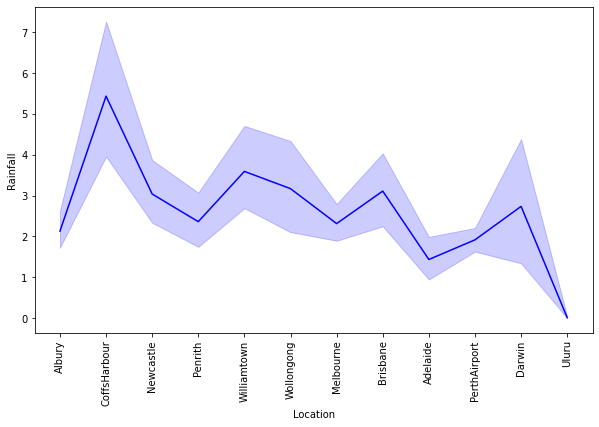


 -------------------------------------WindGustDir-------------------------------------


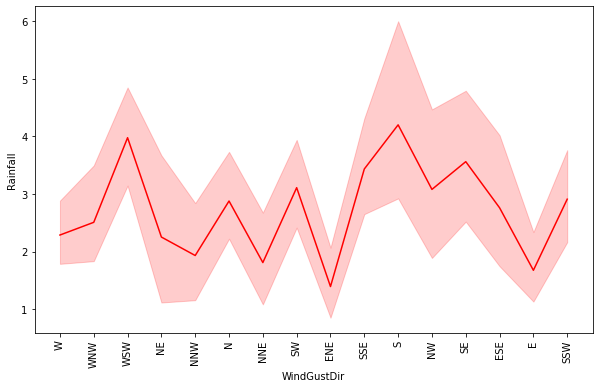


 -------------------------------------WindDir9am-------------------------------------


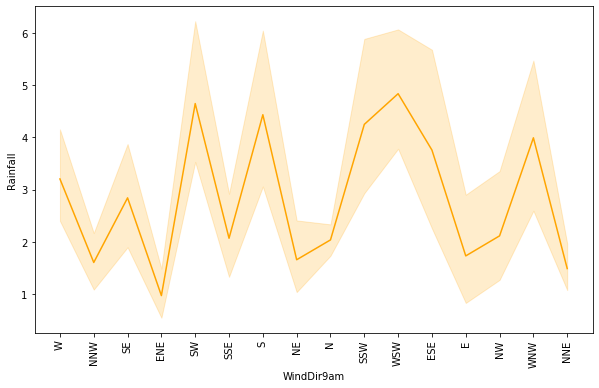


 -------------------------------------WindDir3pm-------------------------------------


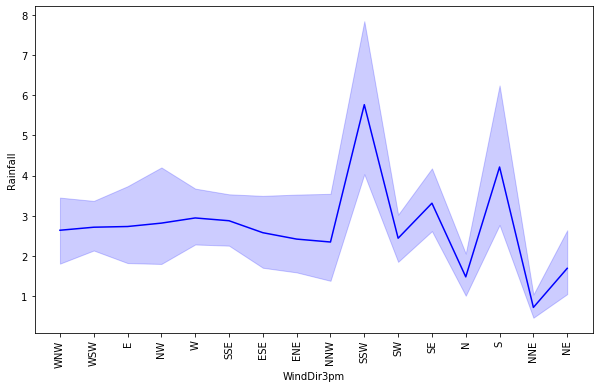


 -------------------------------------RainToday-------------------------------------


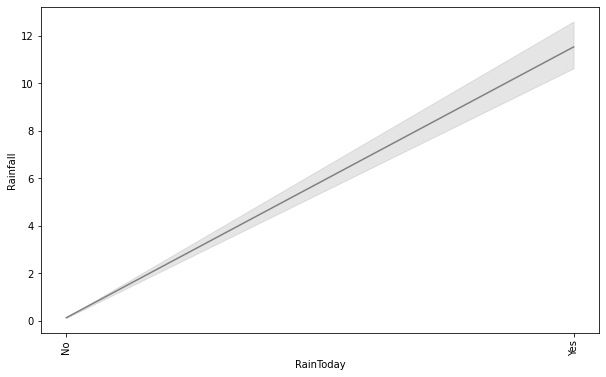

In [985]:
j = ['blue', 'red', 'orange', 'blue', 'grey']
for i,j in zip(df_object[:-1], j):
    print("\n",'-------------------------------------'+i+ '-------------------------------------')
    plt.figure(figsize=(10,6))
    sns.lineplot(x= i ,y = 'Rainfall' ,data=df, color = j)
    plt.xticks(rotation = 90)
    plt.show()

### Observations:

- Location: CoffsHarbour having higher volume of rainfall.


- WindGusdir: When WindGustDir are in WSW and S directions then rainfall volumes are higher as per graph.


- WinDir9am: Rainfall are more when winds at 9am having direction are SW, S, SSW, WSW and WNW. 


- WinDir3pm: Rainfall are more when winds at 3pm having direction are SSW, S and SE. 

### Month 

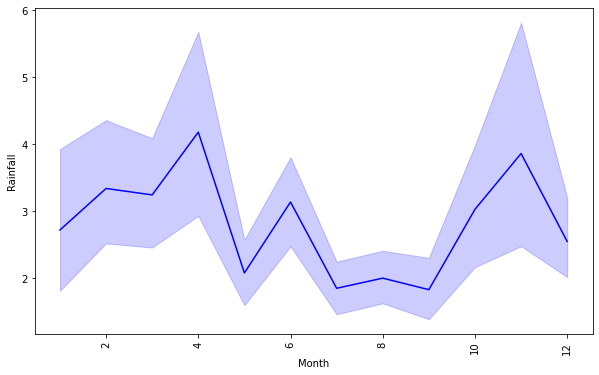

In [986]:
plt.figure(figsize=(10,6))
sns.lineplot(x= 'Month' ,y = 'Rainfall' ,data=df, color = 'blue')
plt.xticks(rotation = 90)
plt.show()

#### Observations: From above graph we find that in the 4th, 6th and 11th month rainfall morer rather than other months. 

### Category Plot


 -------------------------------------Location-------------------------------------


<Figure size 432x288 with 0 Axes>

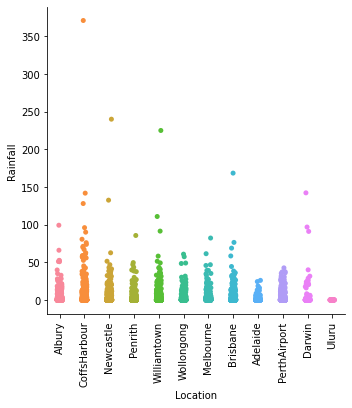


 -------------------------------------WindGustDir-------------------------------------


<Figure size 432x288 with 0 Axes>

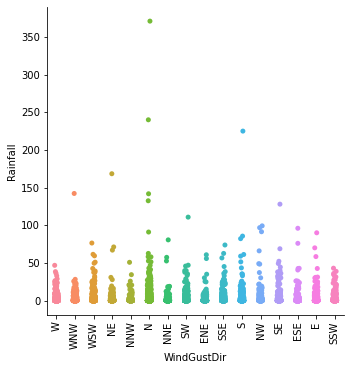


 -------------------------------------WindDir9am-------------------------------------


<Figure size 432x288 with 0 Axes>

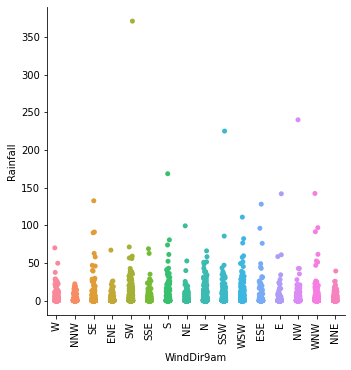


 -------------------------------------WindDir3pm-------------------------------------


<Figure size 432x288 with 0 Axes>

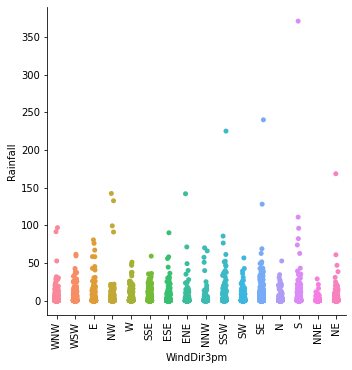


 -------------------------------------RainToday-------------------------------------


<Figure size 432x288 with 0 Axes>

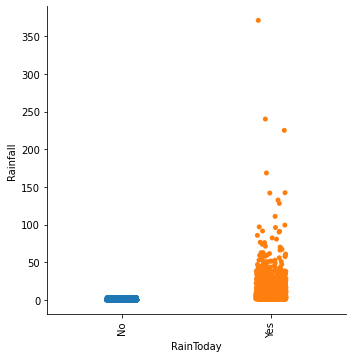

In [987]:
for i in df_object[:-1]:
    print("\n",'-------------------------------------'+i+ '-------------------------------------')
    plt.figure(figsize=(6,4))
    sns.catplot(x= i, y = 'Rainfall' ,data = df, height = 5, aspect = 1)
    plt.xticks(rotation = 90)
    plt.show()


### Observations:

- Location: CoffsHarbour having higher volume of rainfall.


- WindGusdir: When WindGustDir are in WSW and S directions then rainfall volumes are higher as per graph.


- WinDir9am: Rainfall are more when winds at 9am having direction are SW, S, SSW, WSW and WNW. 


- WinDir3pm: Rainfall are more when winds at 3pm having direction are SSW, S and SE. 
    

### Bivariate Analysis

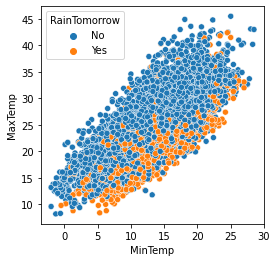

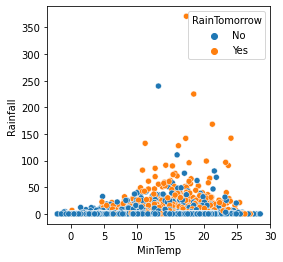

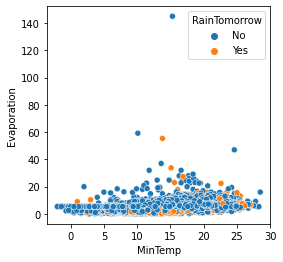

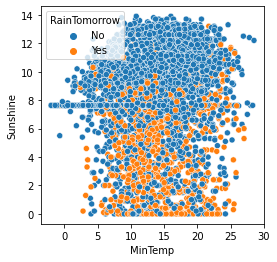

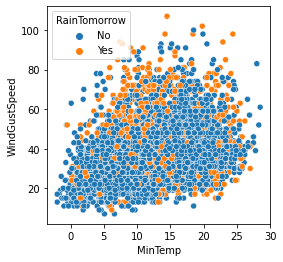

...

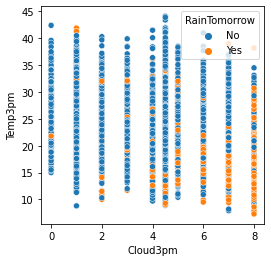

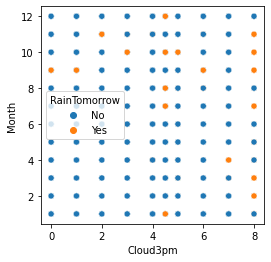

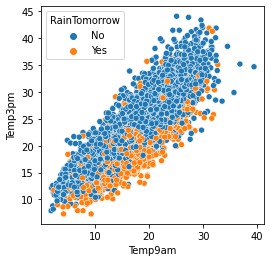

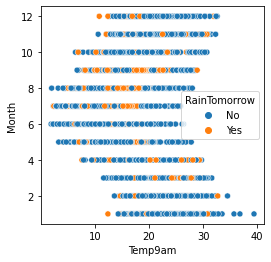

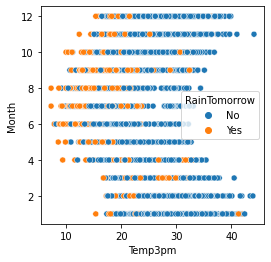

In [37]:
for i in range(len(df_num)):
    for j in df_num[i+1:]:
        plt.figure(figsize = (4,4))
        sns.scatterplot(df[df_num[i]], df[j], hue = df['RainTomorrow'])

### Observations:

- MinTemp and MaxTemp linearly increases and vice versa also rain chances also increases.


- Decreasing pressure may increase the chances of rain as per dataset.


- Temp9am and Temp3pm are linearly increase with min and max temperature.


- High humidity increases to chances of rainfall. 

### Violin Plot

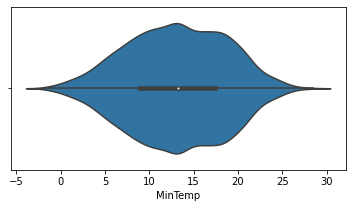

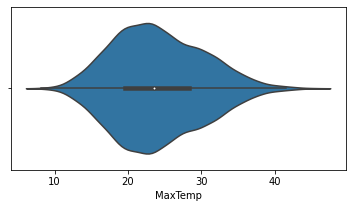

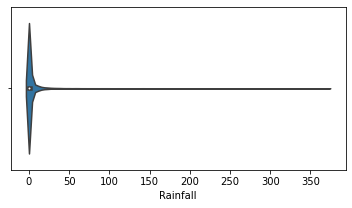

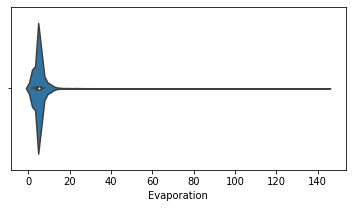

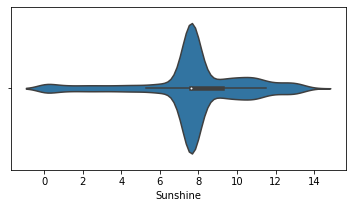

...

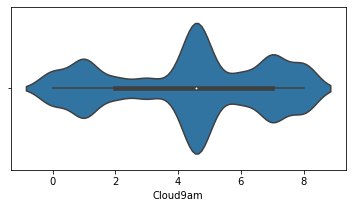

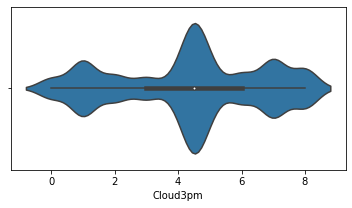

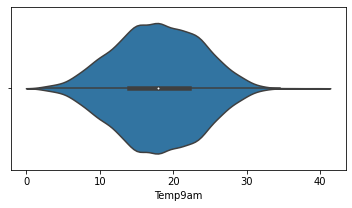

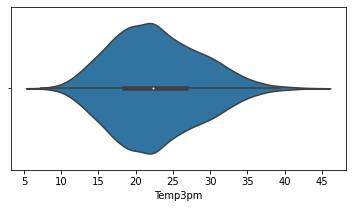

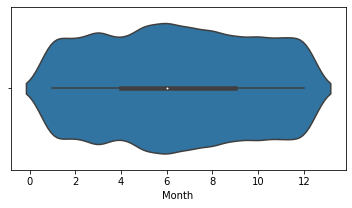

In [38]:
for i in df_num:
    plt.figure(figsize = (6,3))
    sns.violinplot(df[i] , data = df)
    
    
# checking spreading density of the data

### Distribution Plot

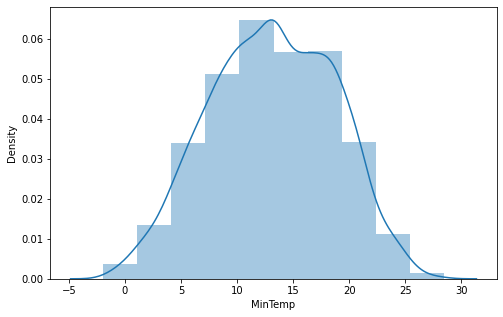

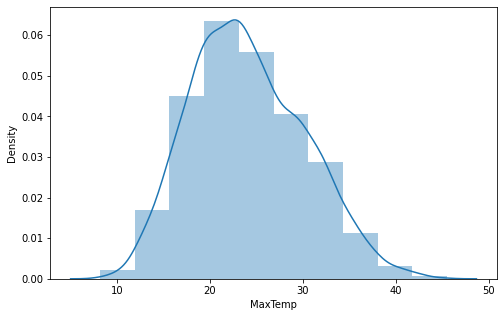

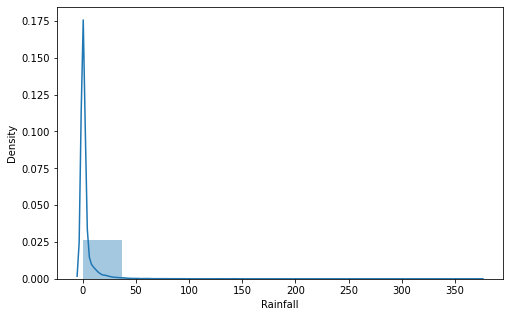

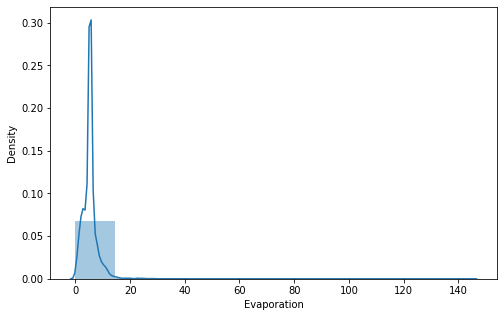

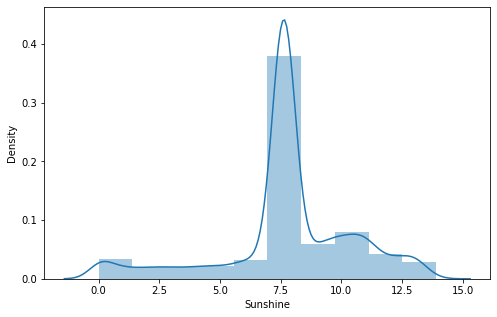

...

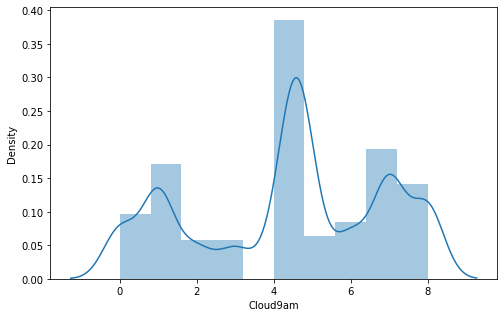

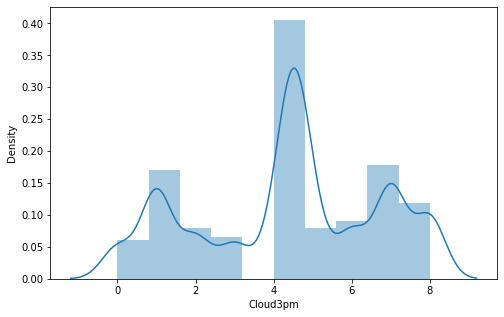

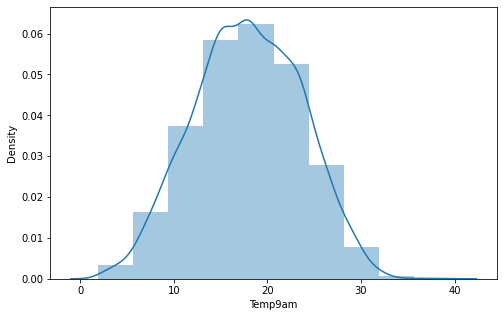

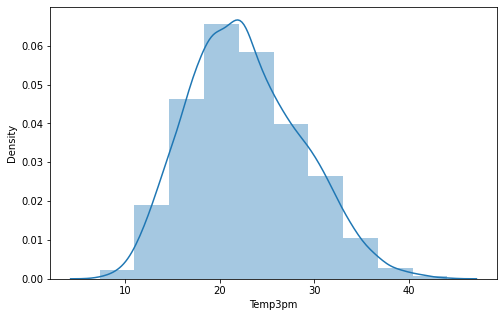

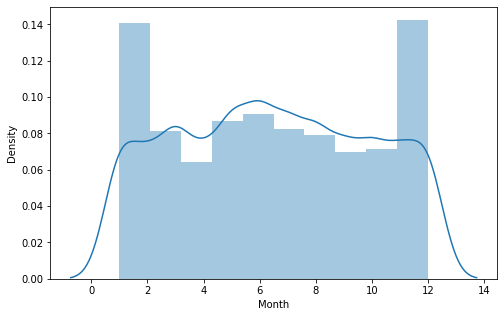

In [41]:
for i in df_num:
    plt.figure(figsize = (8,5))
    sns.distplot(df[i] , bins = 10)
    
    
# checking spreading distribution of the data

### Observations: 

- MinTemp: Min temperature lies in the range of approx 0 to 28.

- MaxTemp: Max temperature lies in the range of approx 10 to 40.

- RainFall: Rainfall lies in the range of 0 to 10 mm approx.

- Evaportaion: Most of the observations lies in the range of 0 to 10 in evaporation.

- Sunshine: Sunshines are morely lies in the range of 7 to 14 approx.

- WindGustSpeed: It mainly lies in the range of 0.5 to 80.

- WindSpeed9am: Wind speed at 9 am are morely in the range of 0 to 40. 

- WindSpeed3pm: Wind speed at 3 pm are morely in the range of 0 to 45.

- Humidity9am: Humidity at 9 am are morely in the range of 20 to 100.

- Humidity3pm: Humidity at 3 pm are morely in the range of 0 to 100

- Pressure9am: Pressure at 9am having peak value of approx 1017.

- Pressure3pm: Pressure at 3pm having peak value of approx 1015.

- Cloud9am: Cloud at 9am having peak value of approx 4.3.

- Cloud3pm: Cloud at 3pm having peak value of approx 4.3.

- Temp9am: Temp at 9 am are lies in the range of 0 to 30.

- Temp3pm: Temp at 3 pm are lies in the range of 5 to 45.

### Checking Outleirs

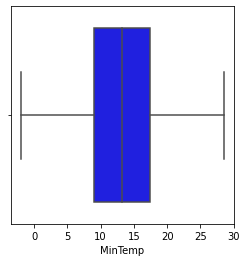

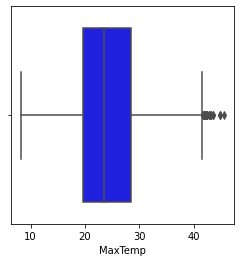

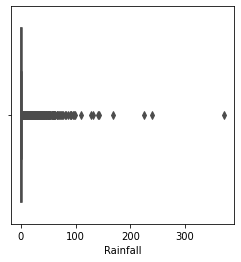

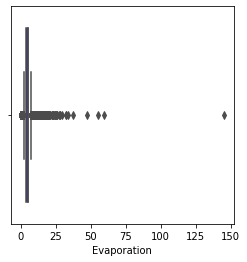

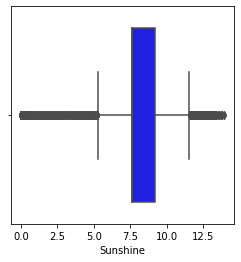

...

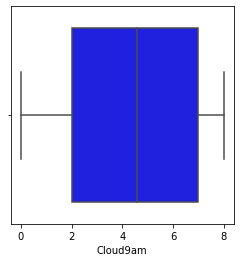

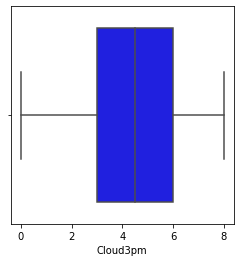

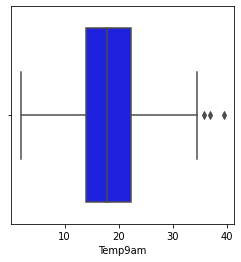

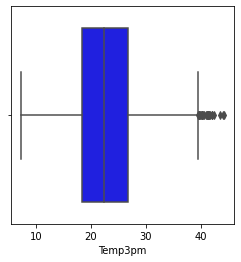

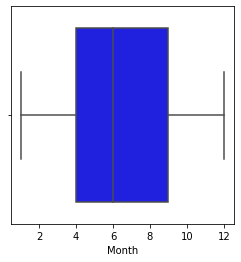

In [40]:
for i in df_num:
    plt.figure(figsize = (4,4))
    sns.boxplot(df[i], orient='v', color='blue')

#### From above graph we find that MaxTemp, Rainfall, Evaporation, Sunshine, WindGustSpeed, WindSpeed9am, Windspeed3pm, Humidity9am, Humidity3pm, Pressure9am, Pressure3pm , Temp9am and Temp3pm having outliers.

### Checking Skewness

In [42]:
df[df_num].skew().sort_values()

Sunshine         -0.743465
Cloud9am         -0.290706
Humidity9am      -0.256373
Cloud3pm         -0.227510
MinTemp          -0.084061
Temp9am          -0.046747
Month             0.019887
Pressure9am       0.020738
Pressure3pm       0.031706
Humidity3pm       0.149121
MaxTemp           0.328203
Temp3pm           0.349495
WindSpeed3pm      0.545261
WindGustSpeed     0.741850
WindSpeed9am      0.953664
Evaporation      13.507343
Rainfall         13.641262
dtype: float64

<Figure size 36x36 with 0 Axes>

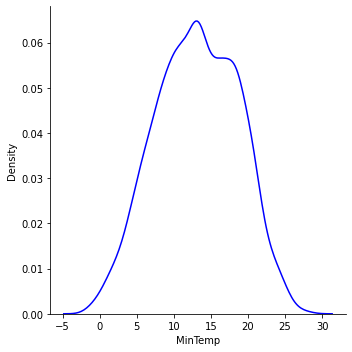

<Figure size 36x36 with 0 Axes>

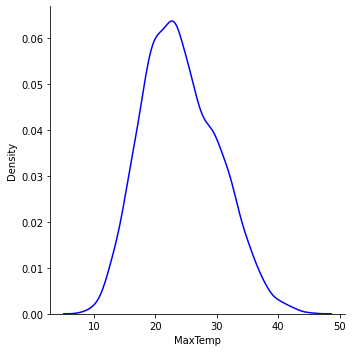

<Figure size 36x36 with 0 Axes>

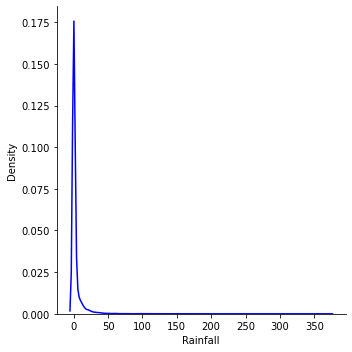

<Figure size 36x36 with 0 Axes>

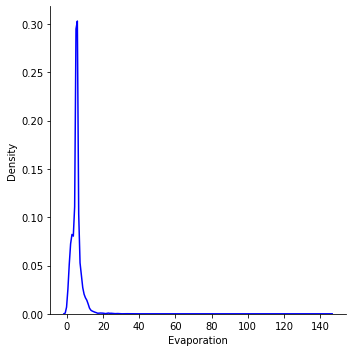

<Figure size 36x36 with 0 Axes>

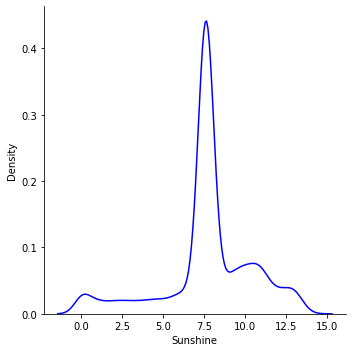

<Figure size 36x36 with 0 Axes>

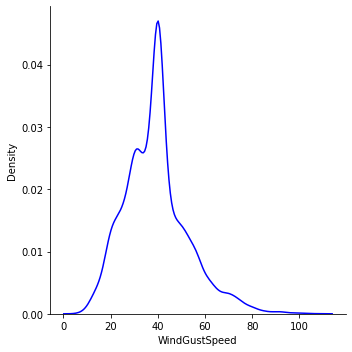

<Figure size 36x36 with 0 Axes>

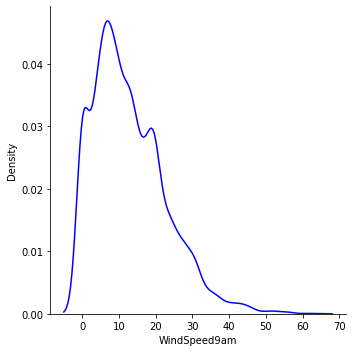

<Figure size 36x36 with 0 Axes>

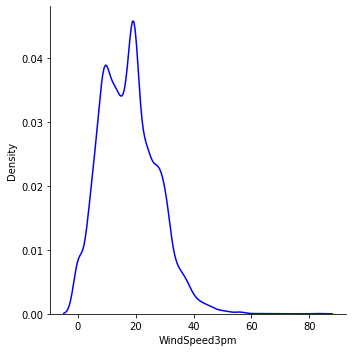

<Figure size 36x36 with 0 Axes>

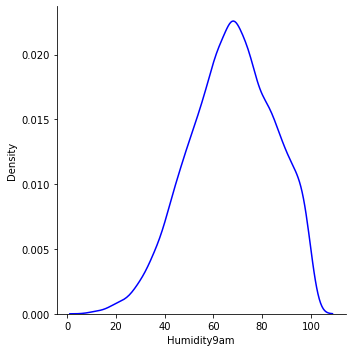

<Figure size 36x36 with 0 Axes>

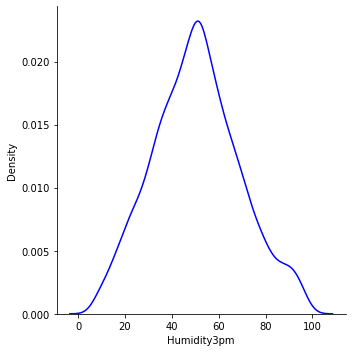

<Figure size 36x36 with 0 Axes>

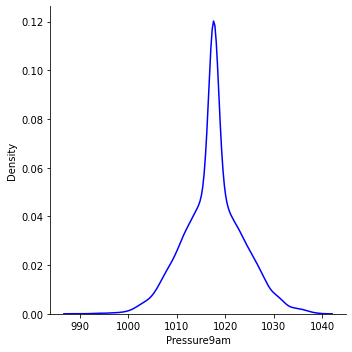

<Figure size 36x36 with 0 Axes>

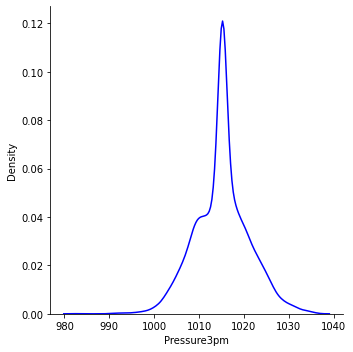

<Figure size 36x36 with 0 Axes>

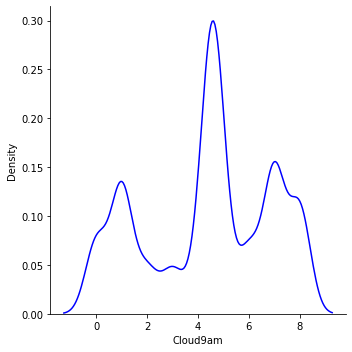

<Figure size 36x36 with 0 Axes>

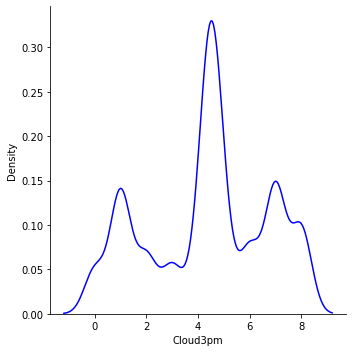

<Figure size 36x36 with 0 Axes>

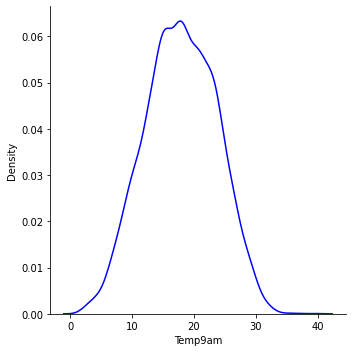

<Figure size 36x36 with 0 Axes>

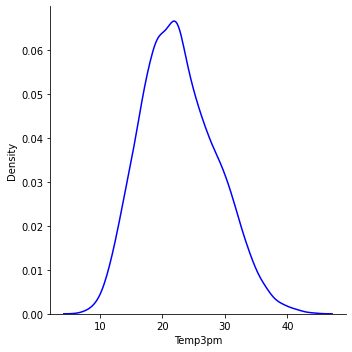

<Figure size 36x36 with 0 Axes>

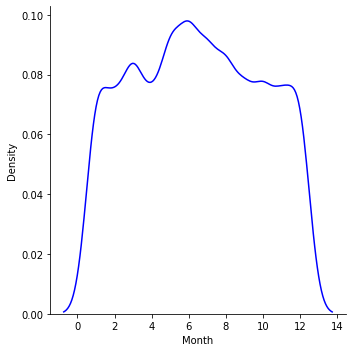

In [43]:
for i in df_num:
    plt.figure(figsize = (0.5,0.5))
    sns.displot(df[i], kind = 'kde', color = 'blue',)

#### Sunshine, Cloud9am, Humidity9am, Cloud3pm, MinTemp, Temp9am having left skewness while rest of the dataset are right skewed toward the dataset.

### Checking Overall of the Dataset by Pairplot

<Figure size 576x576 with 0 Axes>

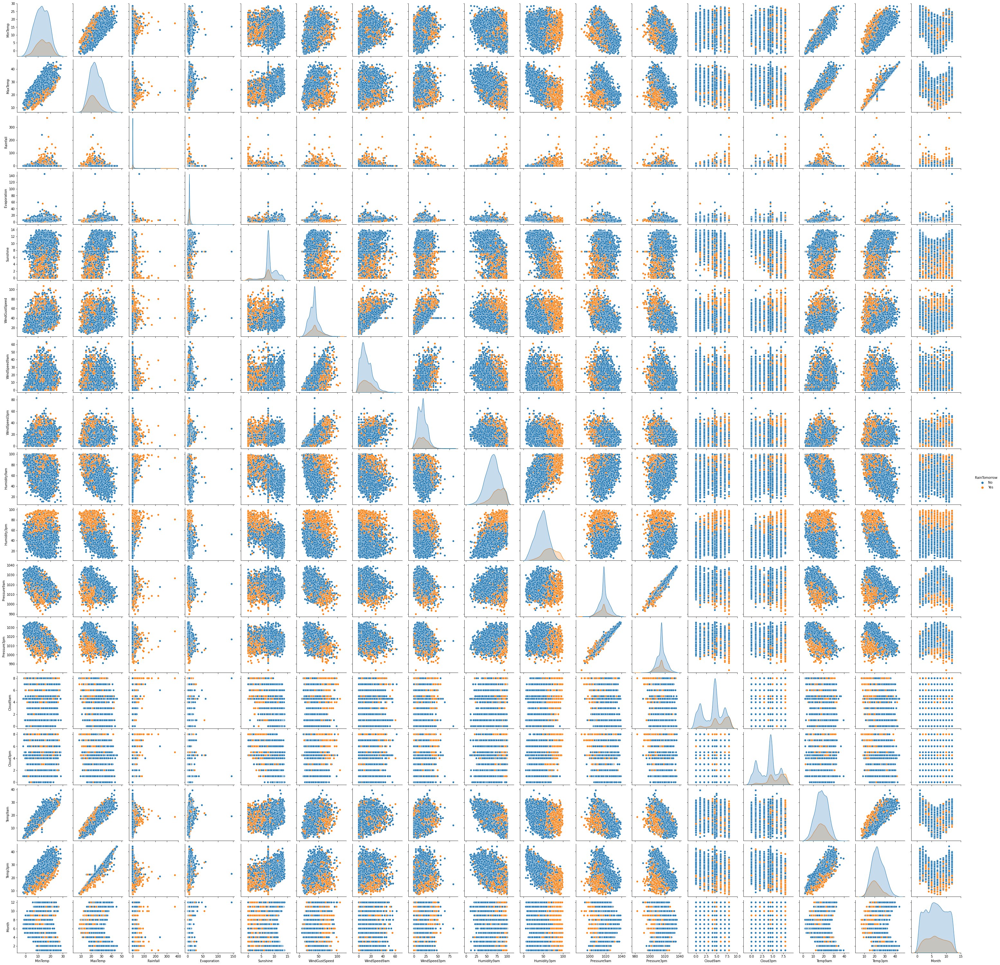

In [988]:
plt.figure(figsize = (8,8))
sns.pairplot(df, hue = 'RainTomorrow')

#### Observations: Measured all analysis above are similar to pairplot.

### Converting objects dataset into categorical numerical form

In [472]:
from sklearn.preprocessing import OrdinalEncoder, LabelEncoder
onc = OrdinalEncoder()
le = LabelEncoder()

In [473]:
df['RainTomorrow'] = le.fit_transform(df['RainTomorrow'])

In [474]:
for i in ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday']:
    df[i] = onc.fit_transform(df[i].values.reshape(-1,1))

In [475]:
df.head(1) # checking result

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Month
0,1.0,13.4,22.9,0.6,5.389395,7.632205,13.0,44.0,13.0,14.0,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,4.503183,16.9,21.8,0.0,0,12


## Removing Outliers from the Dataset

In [476]:
from scipy.stats import zscore

z = np.abs(zscore(df))

# taking thresold value = 3
#np.where(z>3)

df_z = df[(z<3).all(axis = 1)]

In [477]:
print(df_z.shape)
print(df.shape)

(6400, 23)
(6753, 23)


In [478]:
percentage = round((6753 - 6400)/6753*100,2)
print(percentage, "Percentage of data loss in dataset")  

5.23 Percentage of data loss in dataset


## Removing Outliers with Interquartile Method

In [479]:
Q1 = df.quantile(.25)
Q3 = df.quantile(.75)
IQR = Q3 - Q1

In [480]:
df_IQR = df[~((df<(Q1 - 1.5*IQR)) | (df>(Q3 + 1.5*IQR))).any(axis = 1)]

In [481]:
print(df_IQR.shape)
print(df.shape)

(2912, 23)
(6753, 23)


In [482]:
percentage = round((6753 - 2912)/6753*100,2)
print(percentage, "Percentage of data loss in dataset")  

56.88 Percentage of data loss in dataset


#### From above two methods of removing outliers we find that Zscore give lesser data loss with respect to interquartile method hence we are selecting Zscore method for removing outliers.

In [483]:
df.describe()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Month
count,6753.000000,6753.000000,6753.00000,6753.000000,6753.000000,6753.000000,6753.000000,6753.000000,6753.000000,6753.000000,6753.000000,6753.000000,6753.000000,6753.000000,6753.000000,6753.000000,6753.000000,6753.000000,6753.000000,6753.000000,6753.000000,6753.000000,6753.000000
mean,5.322819,13.109905,24.09665,2.781471,5.339911,7.767278,7.033763,39.143015,7.018658,7.841256,12.790726,17.584120,67.508665,50.477230,1017.628989,1015.142317,4.400003,4.372061,17.894211,22.705296,0.232785,0.232785,6.466756
std,3.101422,5.544364,6.13424,10.489645,3.346219,2.738512,4.791047,13.391740,4.551373,4.489684,9.794558,9.555641,17.194167,18.510876,6.031932,5.971790,2.478423,2.326264,5.726233,5.975896,0.422638,0.422638,3.377090
min,0.000000,-2.000000,8.20000,0.000000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000,0.000000,0.000000,1.000000
25%,2.000000,9.000000,19.60000,0.000000,4.000000,7.632205,3.000000,30.000000,3.000000,4.000000,6.000000,11.000000,56.000000,38.000000,1014.200000,1011.500000,2.000000,3.000000,13.900000,18.400000,0.000000,0.000000,4.000000
50%,6.000000,13.193305,23.50000,0.000000,5.389395,7.632205,7.000000,39.000000,7.000000,8.000000,11.000000,17.000000,68.000000,50.000000,1017.640233,1015.236075,4.566622,4.503183,17.900000,22.300000,0.000000,0.000000,6.000000
75%,8.000000,17.400000,28.40000,1.200000,5.389395,9.200000,12.000000,46.000000,11.000000,12.000000,19.000000,24.000000,80.000000,62.000000,1020.900000,1018.400000,7.000000,6.000000,22.200000,26.800000,0.000000,0.000000,9.000000
max,11.000000,28.500000,45.50000,371.000000,145.000000,13.900000,15.000000,107.000000,15.000000,15.000000,63.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000,1.000000,1.000000,12.000000


<AxesSubplot:>

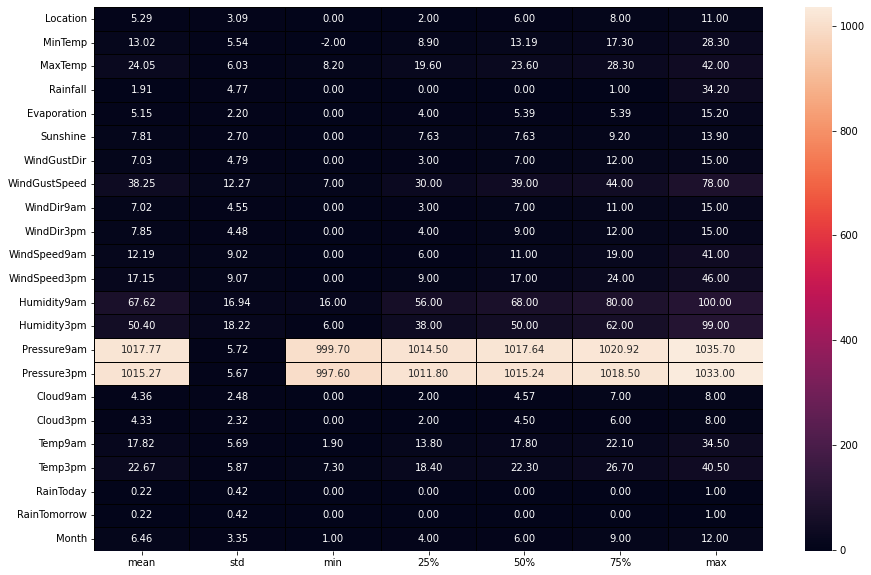

In [484]:
plt.figure(figsize = (15,10))
sns.heatmap(df_z.describe()[1:].transpose(), annot = True, linecolor='black', linewidths=0.5, fmt = '.2f')

#checking description visually

#### From above code we find that Pressure9am and Pressure3pm values are much higher than its dataset value from this we conclude that this column dataset so much having outliers and correlating the dataset.

## Checking Correlation of the dataset

In [485]:
df_z.corr()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Month
Location,1.000000,0.091465,0.073489,0.010724,0.129550,0.057984,-0.074154,0.278137,-0.102631,-0.000430,0.247659,0.225166,-0.033320,-0.000250,-0.031868,-0.016913,-0.009145,-0.008148,0.098652,0.069631,-0.004481,0.000591,-0.070598
MinTemp,0.091465,1.000000,0.730199,0.101341,0.361392,0.054035,-0.156506,0.243402,-0.021350,-0.143718,0.176376,0.195129,-0.149335,0.078431,-0.447361,-0.448221,0.087359,0.038105,0.892859,0.699269,0.072756,0.093279,-0.235756
MaxTemp,0.073489,0.730199,1.000000,-0.137967,0.471192,0.363967,-0.224970,0.169848,-0.193406,-0.165582,0.063156,0.123945,-0.415637,-0.417902,-0.349022,-0.426730,-0.242382,-0.241601,0.865385,0.975024,-0.219697,-0.158496,-0.173160
Rainfall,0.010724,0.101341,-0.137967,1.000000,-0.110423,-0.192220,0.084127,0.095576,0.120448,0.073650,0.044841,0.032583,0.305663,0.302943,-0.117161,-0.056832,0.237266,0.195871,-0.029449,-0.147816,0.694963,0.277725,-0.001487
Evaporation,0.129550,0.361392,0.471192,-0.110423,1.000000,0.394624,-0.142611,0.220226,-0.139261,-0.024887,0.153790,0.116055,-0.336268,-0.254015,-0.284979,-0.304797,-0.116365,-0.163781,0.423028,0.459902,-0.177614,-0.108421,-0.055695
Sunshine,0.057984,0.054035,0.363967,-0.192220,0.394624,1.000000,-0.103447,0.045050,-0.075481,-0.055569,0.044768,0.082086,-0.391657,-0.440147,-0.028219,-0.086811,-0.544428,-0.564941,0.253612,0.381666,-0.238486,-0.334809,0.002201
WindGustDir,-0.074154,-0.156506,-0.224970,0.084127,-0.142611,-0.103447,1.000000,-0.010685,0.386319,0.503849,0.037494,0.122113,0.035218,0.040711,-0.095720,-0.011873,0.119556,0.084626,-0.176040,-0.236149,0.118081,0.037547,0.040632
WindGustSpeed,0.278137,0.243402,0.169848,0.095576,0.220226,0.045050,-0.010685,1.000000,-0.074598,0.090598,0.555093,0.606496,-0.267624,-0.098748,-0.362559,-0.327709,-0.007915,0.030565,0.223263,0.138335,0.077274,0.163570,0.050390
WindDir9am,-0.102631,-0.021350,-0.193406,0.120448,-0.139261,-0.075481,0.386319,-0.074598,1.000000,0.208074,0.083920,0.056321,-0.000645,0.120101,-0.021924,0.057015,0.070924,0.054568,-0.066939,-0.201964,0.148971,0.034261,0.021175
WindDir3pm,-0.000430,-0.143718,-0.165582,0.073650,-0.024887,-0.055569,0.503849,0.090598,0.208074,1.000000,0.026962,0.098655,-0.004418,-0.012062,-0.130440,-0.040749,0.071743,0.050176,-0.150593,-0.176946,0.095821,-0.000030,0.030336


<AxesSubplot:>

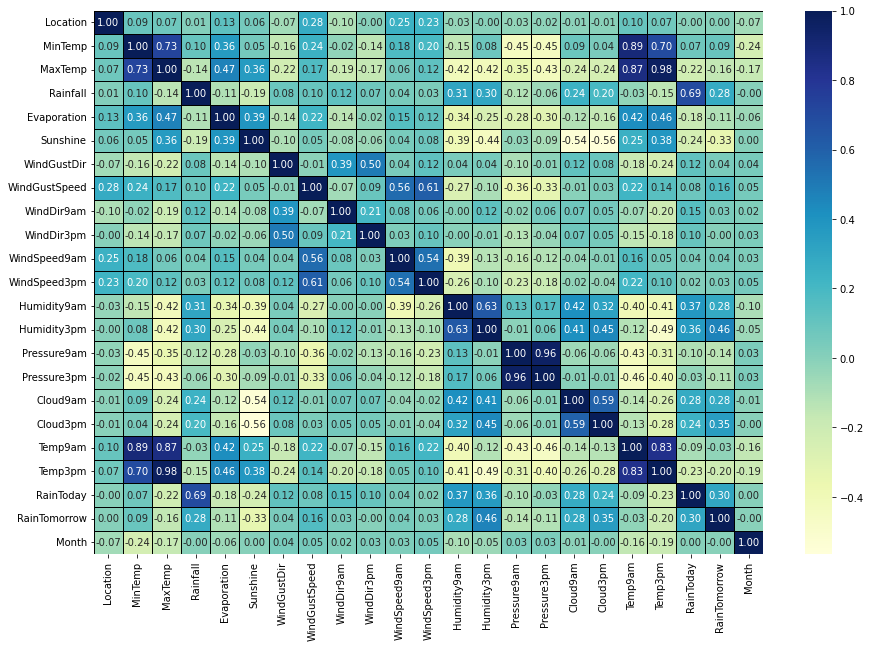

In [486]:
plt.figure(figsize = (15,10))
sns.heatmap(df_z.corr(), annot = True, linecolor = 'black', linewidths = 1, fmt = '.2f', cmap="YlGnBu" )

#### Observations: Temp9am, Temp3pm show very high correlation towards Min and Max temp as per above graph. While Sunshine and clouds show very less correlation.

### Checking Positive and Negative Correlation

<AxesSubplot:>

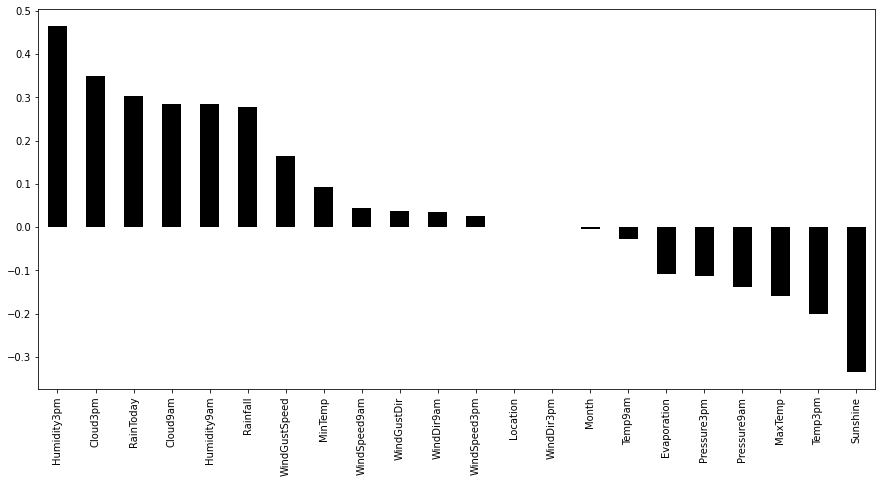

In [487]:
plt.figure(figsize = (15,7))
df_z.corr()['RainTomorrow'].sort_values(ascending = False).drop('RainTomorrow').plot(kind = 'bar', color = 'k')

#### From above graph we find that WindDir3pm, Month, Temp9am, Evaporation, Pressure3pm, Pressure9am, MaxTemp, Temp3pm, Sunshine  these columns of dataset shows negative correlation while rest of dataset shows positive correlation.

### Dividing data for feature selection

In [488]:
x = df_z.drop('RainTomorrow', axis = 1)
y = df_z['RainTomorrow']

In [489]:
print('shape of x', x.shape)
print('Shape of y', y.shape)

shape of x (6400, 22)
Shape of y (6400,)


### Checking multicolinearity of the dataset

In [490]:
import statsmodels.api as sm
from scipy import stats
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [491]:
def calc_vif(x):
    
    vif = pd.DataFrame()
    vif['Variance'] = x.columns
    vif["VIF Factor"] = [variance_inflation_factor(x.values, i) for i in range(x.shape[1])]
    return vif


In [492]:
calc_vif(x[df_num])  # checking VIF of numerical columns

,Variance,VIF Factor
0,MinTemp,58.496303
1,MaxTemp,443.230618
2,Rainfall,1.427639
3,Evaporation,9.947197
4,Sunshine,18.998909
5,WindGustSpeed,20.636956
6,WindSpeed9am,5.433619
7,WindSpeed3pm,8.510379
8,Humidity9am,66.676484
9,Humidity3pm,46.163664


### As we can see that total Pressure9am, Pressure3pm, MaxTemp, Tem3pm and Temp9am show very high vif hence we need to drop it. But due to less number of dataset we are dropping it one by one after checking observations.

In [493]:
x.drop(['Pressure3pm','Pressure9am'], inplace = True, axis = 1) # dropping Pressure3pm and Pressure9am

In [494]:
df_num1 = ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine','WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
'Humidity3pm', 'Cloud9am', 'Cloud3pm','Temp9am', 'Temp3pm', 'Month']

In [495]:
calc_vif(x[df_num1])  # # checking VIF of numerical rest columns

,Variance,VIF Factor
0,MinTemp,48.514888
1,MaxTemp,443.229826
2,Rainfall,1.393015
3,Evaporation,9.884587
4,Sunshine,16.956258
5,WindGustSpeed,19.903481
6,WindSpeed9am,5.001961
7,WindSpeed3pm,8.435413
8,Humidity9am,57.848428
9,Humidity3pm,40.820679


In [496]:
x.drop(['Temp3pm', 'MaxTemp'], inplace = True, axis = 1) # dropping Temp3pm, MaxTemp as it still shows high variance

In [497]:
df_num2 = ['MinTemp', 'Rainfall', 'Evaporation', 'Sunshine','WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
'Humidity3pm', 'Cloud9am', 'Cloud3pm','Temp9am', 'Month']

In [498]:
calc_vif(x[df_num2])  # checking VIF of numerical rest columns

,Variance,VIF Factor
0,MinTemp,46.981716
1,Rainfall,1.353986
2,Evaporation,9.624285
3,Sunshine,16.410074
4,WindGustSpeed,19.346223
5,WindSpeed9am,4.950827
6,WindSpeed3pm,8.219967
7,Humidity9am,26.973107
8,Humidity3pm,17.820763
9,Cloud9am,7.913467


In [499]:
x.drop(['Temp9am'], inplace = True, axis = 1) 

# dropping Temp9am as it still shows high variance and 
#having higher correlation with MinTemp and MaxTemp hence we need to drop it

In [500]:
df_num3 = ['MinTemp', 'Rainfall', 'Evaporation', 'Sunshine','WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
'Humidity3pm', 'Cloud9am', 'Cloud3pm', 'Month']

In [501]:
calc_vif(x[df_num3])   # checking VIF of numerical rest columns

,Variance,VIF Factor
0,MinTemp,8.665666
1,Rainfall,1.326770
2,Evaporation,9.581268
3,Sunshine,12.844576
4,WindGustSpeed,19.253874
5,WindSpeed9am,4.883983
6,WindSpeed3pm,8.143046
7,Humidity9am,26.576886
8,Humidity3pm,17.756702
9,Cloud9am,7.786157


#### Above VIF having still some value with high VIF Factor but we are considering it because of less data left for observations.

In [502]:
x.head(1)

,Location,MinTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Cloud9am,Cloud3pm,RainToday,Month
0,1.0,13.4,0.6,5.389395,7.632205,13.0,44.0,13.0,14.0,20.0,24.0,71.0,22.0,8.0,4.503183,0.0,12


### Removing Skewness

In [503]:
x[df_num3].skew()

MinTemp         -0.079393
Rainfall         3.513120
Evaporation      0.666509
Sunshine        -0.747509
WindGustSpeed    0.434687
WindSpeed9am     0.674225
WindSpeed3pm     0.336932
Humidity9am     -0.233302
Humidity3pm      0.156678
Cloud9am        -0.278603
Cloud3pm        -0.211943
Month            0.030584
dtype: float64

#### Most of the dataset are under thresold value of skewness but Rainfall, Evaporation, Sunshine and windspeed9am having skewness values greater than thresold value.

In [504]:
from sklearn.preprocessing import PowerTransformer
pw = PowerTransformer('yeo-johnson')

In [505]:
x[['Rainfall', 'Evaporation', 'Sunshine', 'WindSpeed9am']] = pw.fit_transform(x[['Rainfall', 'Evaporation', 'Sunshine', 'WindSpeed9am']])

### Using Get Dummies Method to prevent overfitting of Model as Model having so many columns with Multiple Unique Values

In [506]:
x = pd.get_dummies(data = x, columns = ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday'])

In [507]:
x.shape

(6400, 74)

### Using SMOTE to balance the dataset

In [508]:
from imblearn.over_sampling import SMOTE
sm = SMOTE()

In [509]:
x, y = sm.fit_resample(x, y)

<AxesSubplot:xlabel='RainTomorrow', ylabel='count'>

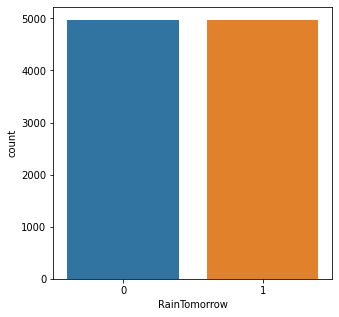

In [510]:
plt.figure(figsize = (5,5))
sns.countplot(y)

### Standard Scalling

In [511]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()

In [512]:
x[df_num3] = sc.fit_transform(x[df_num3])  # train dataset

In [513]:
x.head(1)

,MinTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Cloud9am,Cloud3pm,Month,Location_0.0,Location_1.0,Location_2.0,Location_3.0,Location_4.0,Location_5.0,Location_6.0,Location_7.0,Location_8.0,Location_9.0,Location_10.0,Location_11.0,WindGustDir_0.0,WindGustDir_1.0,WindGustDir_2.0,WindGustDir_3.0,WindGustDir_4.0,WindGustDir_5.0,WindGustDir_6.0,WindGustDir_7.0,WindGustDir_8.0,WindGustDir_9.0,WindGustDir_10.0,WindGustDir_11.0,WindGustDir_12.0,WindGustDir_13.0,WindGustDir_14.0,WindGustDir_15.0,WindDir9am_0.0,WindDir9am_1.0,WindDir9am_2.0,WindDir9am_3.0,WindDir9am_4.0,WindDir9am_5.0,WindDir9am_6.0,WindDir9am_7.0,WindDir9am_8.0,WindDir9am_9.0,WindDir9am_10.0,WindDir9am_11.0,WindDir9am_12.0,WindDir9am_13.0,WindDir9am_14.0,WindDir9am_15.0,WindDir3pm_0.0,WindDir3pm_1.0,WindDir3pm_2.0,WindDir3pm_3.0,WindDir3pm_4.0,WindDir3pm_5.0,WindDir3pm_6.0,WindDir3pm_7.0,WindDir3pm_8.0,WindDir3pm_9.0,WindDir3pm_10.0,WindDir3pm_11.0,WindDir3pm_12.0,WindDir3pm_13.0,WindDir3pm_14.0,WindDir3pm_15.0,RainToday_0.0,RainToday_1.0
0,0.012976,0.43276,0.279052,0.077706,0.350062,0.88749,0.718344,0.003166,-1.761758,1.319961,-0.174548,1.78845,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0


### Feature Selection

In [514]:
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.naive_bayes import GaussianNB, MultinomialNB, BernoulliNB
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, ExtraTreesClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import random

In [515]:
class best_model:
    def best_fit(x, y, model):
        random_state_values = []
        for i in range(0,200):
            x_train, x_test, y_train, y_test = train_test_split(x, y, random_state = i, test_size = 0.30)
            model.fit(x_train, y_train)
            pred_train = model.predict(x_train)
            pred_test = model.predict(x_test)

            if round(accuracy_score(y_train, pred_train)*100,1) == round(accuracy_score(y_test, pred_test)*100,1):
                print("At random_state:-", i)
                print("Training accuracy_score is:-", accuracy_score(pred_train, y_train)*100)
                print("Testing accuracy_score is:-", accuracy_score(pred_test, y_test)*100)
                print("\n")
                random_state_values.append(i)
        print("Best fit random_state_values", random_state_values)
    
    
    def final_model(x, y, model, i):
        x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.30, random_state = i)
        model.fit(x_train, y_train)
        pred_train = model.predict(x_train)
        pred_test = model.predict(x_test)
        print("At random state", i , "model giving best accuracy score","\n")
        Train_accuracy = accuracy_score(pred_train, y_train)
        Test_accuracy = accuracy_score(pred_test, y_test)
        print('Training accuracy:- ', Train_accuracy*100)
        print('Testing accuracy:- ', Test_accuracy*100)
        print("\n")
        print('--------------------------------------')
        print('Confusion Matrix')
        print(confusion_matrix(pred_test, y_test) )
        print("\n")
        print('Classification Report')
        print(classification_report(pred_test, y_test) )
        

    def cross_val_score(model, x, y):
        for value in range(2,8):
            cv = cross_val_score(model, x, y, cv = value).mean()
            print('cross_val_score', cv*100,'at cv =', value,"\n")


## Model 1 Logisitc Regression

In [162]:
model = LogisticRegression()

In [163]:
best_model.best_fit(x, y, model)   #finding best random state

At random_state:- 0
Training accuracy_score is:- 89.59471112388617
Testing accuracy_score is:- 89.60429242119383


At random_state:- 30
Training accuracy_score is:- 89.55159528600173
Testing accuracy_score is:- 89.63782696177063


At random_state:- 36
Training accuracy_score is:- 89.60908306984766
Testing accuracy_score is:- 89.60429242119383


At random_state:- 53
Training accuracy_score is:- 89.4941075021558
Testing accuracy_score is:- 89.50368879946345


At random_state:- 70
Training accuracy_score is:- 89.76717447542397
Testing accuracy_score is:- 89.8054996646546


At random_state:- 81
Training accuracy_score is:- 89.5803391779247
Testing accuracy_score is:- 89.60429242119383


At random_state:- 96
Training accuracy_score is:- 89.68094279965507
Testing accuracy_score is:- 89.738430583501


At random_state:- 104
Training accuracy_score is:- 89.60908306984766
Testing accuracy_score is:- 89.60429242119383


At random_state:- 128
Training accuracy_score is:- 89.6521989077321
Testing a

#### Model giving best accuracy score at random state value 199

In [164]:
best_model.final_model(x, y, model, 199)

At random state 199 model giving best accuracy score 

Training accuracy:-  89.83903420523139
Testing accuracy:-  89.83903420523139


--------------------------------------
Confusion Matrix
[[1405  210]
 [  93 1274]]


Classification Report
              precision    recall  f1-score   support

           0       0.94      0.87      0.90      1615
           1       0.86      0.93      0.89      1367

    accuracy                           0.90      2982
   macro avg       0.90      0.90      0.90      2982
weighted avg       0.90      0.90      0.90      2982



In [173]:
for value in range(80,82):  
            cv = cross_val_score(model, x, y, cv = value).mean()
            print('cross_val_score', cv*100,'at cv =', value,"\n")  
            
# tried so many range and find that from 80 it show similar cross val score

cross_val_score 87.23370967741936 at cv = 80 

cross_val_score 87.41680282619461 at cv = 81 



## Model 2 GaussianNB

In [174]:
model = GaussianNB()

In [175]:
best_model.best_fit(x, y, model)  #finding best random state

At random_state:- 4
Training accuracy_score is:- 79.74992814027019
Testing accuracy_score is:- 79.67806841046277


At random_state:- 20
Training accuracy_score is:- 79.93676343776947
Testing accuracy_score is:- 79.91281019450034


At random_state:- 55
Training accuracy_score is:- 79.97987927565391
Testing accuracy_score is:- 80.04694835680752


At random_state:- 59
Training accuracy_score is:- 80.02299511353837
Testing accuracy_score is:- 80.04694835680752


At random_state:- 117
Training accuracy_score is:- 80.10922678930727
Testing accuracy_score is:- 80.14755197853789


At random_state:- 131
Training accuracy_score is:- 80.20983041103766
Testing accuracy_score is:- 80.21462105969148


At random_state:- 139
Training accuracy_score is:- 79.80741592411611
Testing accuracy_score is:- 79.84574111334675


At random_state:- 154
Training accuracy_score is:- 79.82178787007761
Testing accuracy_score is:- 79.81220657276995


At random_state:- 193
Training accuracy_score is:- 79.92239149180799


#### Model giving best accuracy score at random state value 131

In [176]:
best_model.final_model(x, y, model, 131)

At random state 131 model giving best accuracy score 

Training accuracy:-  80.20983041103766
Testing accuracy:-  80.21462105969148


--------------------------------------
Confusion Matrix
[[1206  304]
 [ 286 1186]]


Classification Report
              precision    recall  f1-score   support

           0       0.81      0.80      0.80      1510
           1       0.80      0.81      0.80      1472

    accuracy                           0.80      2982
   macro avg       0.80      0.80      0.80      2982
weighted avg       0.80      0.80      0.80      2982



In [179]:
for value in range(80,85):  
            cv = cross_val_score(model, x, y, cv = value).mean()
            print('cross_val_score', cv*100,'at cv =', value,"\n")  
            
# tried so many range and find that from 80 it show similar cross val score

cross_val_score 78.10532258064516 at cv = 80 

cross_val_score 78.01957406337877 at cv = 81 

cross_val_score 78.06208095274287 at cv = 82 

cross_val_score 78.10435017380448 at cv = 83 

cross_val_score 78.10725985309377 at cv = 84 



## Model 3 AdaBoostClassifer

In [180]:
model = AdaBoostClassifier()

In [181]:
best_model.best_fit(x, y, model)  #finding best random state

At random_state:- 9
Training accuracy_score is:- 86.40413912043691
Testing accuracy_score is:- 86.3849765258216


At random_state:- 26
Training accuracy_score is:- 86.79218166139695
Testing accuracy_score is:- 86.82092555331991


At random_state:- 38
Training accuracy_score is:- 87.05087668870365
Testing accuracy_score is:- 87.05566733735748


At random_state:- 93
Training accuracy_score is:- 86.38976717447542
Testing accuracy_score is:- 86.3514419852448


At random_state:- 100
Training accuracy_score is:- 87.4389192296637
Testing accuracy_score is:- 87.39101274312542


At random_state:- 105
Training accuracy_score is:- 86.82092555331991
Testing accuracy_score is:- 86.78739101274311


At random_state:- 115
Training accuracy_score is:- 86.82092555331991
Testing accuracy_score is:- 86.75385647216633


At random_state:- 124
Training accuracy_score is:- 86.95027306697327
Testing accuracy_score is:- 86.9550637156271


At random_state:- 132
Training accuracy_score is:- 86.31790744466801
Test

#### Model giving best accuracy score at random state value 100

In [182]:
best_model.final_model(x, y, model, 100)

At random state 100 model giving best accuracy score 

Training accuracy:-  87.4389192296637
Testing accuracy:-  87.39101274312542


--------------------------------------
Confusion Matrix
[[1320  200]
 [ 176 1286]]


Classification Report
              precision    recall  f1-score   support

           0       0.88      0.87      0.88      1520
           1       0.87      0.88      0.87      1462

    accuracy                           0.87      2982
   macro avg       0.87      0.87      0.87      2982
weighted avg       0.87      0.87      0.87      2982



In [186]:
for value in range(80,85):  
            cv = cross_val_score(model, x, y, cv = value).mean()
            print('cross_val_score', cv*100,'at cv =', value,"\n")  
            
# tried so many range and find that from 80 it show similar cross val score

cross_val_score 84.11403225806453 at cv = 80 

cross_val_score 84.1443669445802 at cv = 81 

cross_val_score 84.44225615538909 at cv = 82 

cross_val_score 83.9402146400729 at cv = 83 

cross_val_score 84.00156672838628 at cv = 84 



## Model 3 SGDClassifier

In [189]:
model = SGDClassifier()

In [191]:
best_model.best_fit(x, y, model)  #finding best random state

At random_state:- 23
Training accuracy_score is:- 89.2354124748491
Testing accuracy_score is:- 89.2354124748491


At random_state:- 41
Training accuracy_score is:- 88.6317907444668
Testing accuracy_score is:- 88.56472166331322


At random_state:- 48
Training accuracy_score is:- 88.11440068985341
Testing accuracy_score is:- 88.06170355466129


At random_state:- 53
Training accuracy_score is:- 89.30727220465651
Testing accuracy_score is:- 89.2689470154259


At random_state:- 99
Training accuracy_score is:- 89.2354124748491
Testing accuracy_score is:- 89.16834339369551


At random_state:- 109
Training accuracy_score is:- 89.24978442081057
Testing accuracy_score is:- 89.16834339369551


At random_state:- 160
Training accuracy_score is:- 88.96234550158091
Testing accuracy_score is:- 88.96713615023474


At random_state:- 190
Training accuracy_score is:- 88.61741879850533
Testing accuracy_score is:- 88.59825620389


At random_state:- 191
Training accuracy_score is:- 89.20666858292613
Testing 

#### Model giving best accuracy score at random state value 53

In [201]:
best_model.final_model(x, y, model, 53)

At random state 53 model giving best accuracy score 

Training accuracy:-  89.03420523138833
Testing accuracy:-  89.10127431254192


--------------------------------------
Confusion Matrix
[[1450  252]
 [  73 1207]]


Classification Report
              precision    recall  f1-score   support

           0       0.95      0.85      0.90      1702
           1       0.83      0.94      0.88      1280

    accuracy                           0.89      2982
   macro avg       0.89      0.90      0.89      2982
weighted avg       0.90      0.89      0.89      2982



In [196]:
for value in range(80,85):  
            cv = cross_val_score(model, x, y, cv = value).mean()
            print('cross_val_score', cv*100,'at cv =', value,"\n")  
            
# tried so many range and find that from 80 it show similar cross val score

cross_val_score 86.3915322580645 at cv = 80 

cross_val_score 86.45142765938894 at cv = 81 

cross_val_score 86.56933920646618 at cv = 82 

cross_val_score 86.96204988019304 at cv = 83 

cross_val_score 86.8093847708575 at cv = 84 



## Model 5 LGBMClassifier

In [205]:
model = LGBMClassifier()

In [203]:
best_model.best_fit(x, y, model)  #finding best random state

Best fit random_state_values []


#### We didn't find any best random state value hence we are checking with some random states below

In [206]:
for i in random.sample(range(1, 200), 30):
    x_train, x_test, y_train, y_test = train_test_split(x, y, random_state = i, test_size = 0.30)
    model.fit(x_train, y_train)
    pred_train = model.predict(x_train)
    pred_test = model.predict(x_test)
    training = accuracy_score(pred_train, y_train)
    testing = accuracy_score(pred_test, y_test)
            
    #if np.abs(round(training, 2) - round(testing, 2)) < 0.01:
                
    print("At random_state:-", i)
    print("Training accuracy_score is:-", accuracy_score(pred_train, y_train)*100)
    print("Testing accuracy_score is:-", accuracy_score(pred_test, y_test)*100)
    print("\n")


At random_state:- 149
Training accuracy_score is:- 96.49324518539811
Testing accuracy_score is:- 89.53722334004024


At random_state:- 172
Training accuracy_score is:- 96.55073296924404
Testing accuracy_score is:- 90.61032863849765


At random_state:- 103
Training accuracy_score is:- 96.39264156366772
Testing accuracy_score is:- 89.83903420523139


At random_state:- 20
Training accuracy_score is:- 96.37826961770624
Testing accuracy_score is:- 89.67136150234741


At random_state:- 135
Training accuracy_score is:- 96.63696464501294
Testing accuracy_score is:- 90.47619047619048


At random_state:- 182
Training accuracy_score is:- 96.55073296924404
Testing accuracy_score is:- 89.40308517773306


At random_state:- 119
Training accuracy_score is:- 96.4213854555907
Testing accuracy_score is:- 89.87256874580818


At random_state:- 59
Training accuracy_score is:- 96.4213854555907
Testing accuracy_score is:- 89.63782696177063


At random_state:- 58
Training accuracy_score is:- 96.579476861167
Te

#### Model giving best accuracy score at random state value 148

In [207]:
best_model.final_model(x, y, model, 148)

At random state 148 model giving best accuracy score 

Training accuracy:-  96.45012934751365
Testing accuracy:-  90.3420523138833


--------------------------------------
Confusion Matrix
[[1382  189]
 [  99 1312]]


Classification Report
              precision    recall  f1-score   support

           0       0.93      0.88      0.91      1571
           1       0.87      0.93      0.90      1411

    accuracy                           0.90      2982
   macro avg       0.90      0.90      0.90      2982
weighted avg       0.91      0.90      0.90      2982



In [208]:
for value in range(80,85):  
            cv = cross_val_score(model, x, y, cv = value).mean()
            print('cross_val_score', cv*100,'at cv =', value,"\n")  
            
# tried so many range and find that from 80 it show similar cross val score

cross_val_score 87.2091935483871 at cv = 80 

cross_val_score 87.19450491408375 at cv = 81 

cross_val_score 87.2366755777028 at cv = 82 

cross_val_score 86.98162397489114 at cv = 83 

cross_val_score 87.14494272285187 at cv = 84 



## Finalizing Best Models

In [212]:
# models                 accuracy_score_training  accuracy_score_training    CV score        CV state    Differences in accuracy

# LogisticRegression       89.83903420523139       89.83903420523139      87.41680282619461     81      0.0
# GaussianNB               80.20983041103766       80.21462105969148      78.10725985309377     84      0.004790648653823837 
# AdaboostClassifier       87.4389192296637        87.39101274312542      84.00156672838628     84      0.047906486538281
# SGDClassifier            89.03420523138833       89.10127431254192      86.96204988019304     83      0.06706908115359056
# LGBMClassifier           96.45012934751365       90.3420523138833       87.2091935483871      80      6.108077033630352

### From above models we find that:
   - LogisticRegression show good result with 0 difference in accuracy also having higher CV, hence we are considering it for model building.
   
   
   - GaussianNB and Adaboostclassifer show lesser accuracy than other models hence we can't consider it.
   
   
   - SGDClassifier shows great result but its CV score is less than logisticRegression also it shows different result when we are going to predict dataset with same random state hence we can't consider it.
   
   
   - LGBMClassifer having high difference in accuracy of training and testing hence we can't consider it.

## Final model LogisticRegression

### Ensemble Technique


## Hyper Parameter Tuning

In [211]:
# using hyper parameter tuning for AdaBoost Classifier to find out best criterion

model = LogisticRegression()

#Default params
# LogisticRegression(penalty='l2', *, dual=False, tol=0.0001, C=1.0, fit_intercept=True, intercept_scaling=1, 
#                    class_weight=None, random_state=None, 
#                    solver='lbfgs', max_iter=100, multi_class='auto', verbose=0, warm_start=False, n_jobs=None, l1_ratio=None)

param = {'penalty' : ['l1', 'l2', 'elasticnet', 'none'], 
             'solver' : ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
             'max_iter' : [100, 150,200], 
            'multi_class' : ['auto', 'ovr', 'multinomial']}

gd = GridSearchCV(model, param_grid=param cv = 81)
gd.fit(x, y)
gd.best_params_

# {'max_iter': 100,
#  'multi_class': 'auto',
#  'penalty': 'l2',
#  'solver': 'liblinear'}

{'max_iter': 100,
 'multi_class': 'auto',
 'penalty': 'l2',
 'solver': 'liblinear'}

### Final Model LogisticRegression

In [222]:
final_model = LogisticRegression(max_iter = 100, multi_class = 'auto', penalty = 'l2', solver = 'liblinear' )

In [224]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.30, random_state = 199)
final_model.fit(x_train, y_train)
pred_train = final_model.predict(x_train)
pred_test = final_model.predict(x_test)
print("At random state", 199 , "model giving best accuracy score","\n")
Train_accuracy = accuracy_score(pred_train, y_train)
Test_accuracy = accuracy_score(pred_test, y_test)
print('Training accuracy:- ', Train_accuracy*100)
print('Testing accuracy:- ', Test_accuracy*100)
print("\n")
print('--------------------------------------')
print('Confusion Matrix')
print(confusion_matrix(pred_test, y_test) )
print("\n")
print('Classification Report')
print(classification_report(pred_test, y_test) )   # at random state 199 model shows best accuracy

At random state 199 model giving best accuracy score 

Training accuracy:-  89.76717447542397
Testing accuracy:-  89.87256874580818


--------------------------------------
Confusion Matrix
[[1405  209]
 [  93 1275]]


Classification Report
              precision    recall  f1-score   support

           0       0.94      0.87      0.90      1614
           1       0.86      0.93      0.89      1368

    accuracy                           0.90      2982
   macro avg       0.90      0.90      0.90      2982
weighted avg       0.90      0.90      0.90      2982



In [226]:
cv = cross_val_score(final_model, x, y, cv = 81).mean()
print('cross_val_score', cv*100,'at cv =', 81  )

cross_val_score 87.38660914235129 at cv = 81


### Using Predict Proba function for finding accuracy target variable

In [227]:
final_pred_prob = final_model.predict_proba(x_test)[:,1]

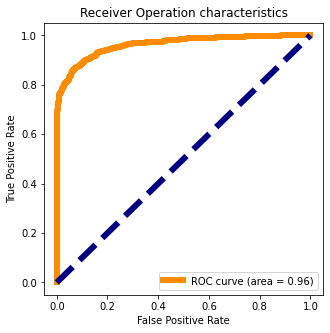

In [228]:
from sklearn.metrics import roc_curve, auc
fpr, tpr, thresolds = roc_curve(y_test, final_pred_prob)
roc_auc = auc(fpr, tpr)

plt.figure(figsize = (5,5))
plt.plot(fpr, tpr, color = 'darkorange', lw = 6, label = "ROC curve (area = %0.2f)" % roc_auc)
plt.plot([0,1],[0,1], color = 'navy', lw = 6, linestyle = '--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver Operation characteristics")
plt.legend(loc = "lower right")
plt.show()

### Deploy Model

In [229]:
import pickle

filename = "RainTomorrow.pkl"
pickle.dump(final_model, open(filename, 'wb'))

### Loading Model

In [230]:
load = pickle.load(open('RainTomorrow.pkl', 'rb'))
result = load.score(x_test, y_test)
print(result)

0.8987256874580818


### Conclusion

In [231]:
conclusion = pd.DataFrame()
conclusion['Predicted RainTomorrow'] = np.array(model.predict(x_test))
conclusion['Actual RainTomorrow'] = np.array(y_test)

In [236]:
conclusion.sample(10)

,Predicted RainTomorrow,Actual RainTomorrow
1605,0,0
2340,1,1
1203,1,1
2203,1,1
2974,1,1
2824,0,1
811,0,0
1563,1,1
636,1,1
462,1,1


# Prediction of Rainfall

In [813]:
df_rain = df.copy() # copying main dataset for Rainfall prediction

In [814]:
df_rain.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Month
0,1.0,13.4,22.9,0.6,5.389395,7.632205,13.0,44.0,13.0,14.0,20.0,24.0,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,0.0,0,12
1,1.0,7.4,25.1,0.0,5.389395,7.632205,14.0,44.0,6.0,15.0,4.0,22.0,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,0.0,0,12
2,1.0,12.9,25.7,0.0,5.389395,7.632205,15.0,46.0,13.0,15.0,19.0,26.0,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,0.0,0,12
3,1.0,9.2,28.0,0.0,5.389395,7.632205,4.0,24.0,9.0,0.0,11.0,9.0,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,0.0,0,12
4,1.0,17.5,32.3,1.0,5.389395,7.632205,13.0,41.0,1.0,7.0,7.0,20.0,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,0.0,0,12


## Removing Outliers from the Dataset

In [815]:
from scipy.stats import zscore

z = np.abs(zscore(df_rain))

# taking thresold value = 3
#np.where(z>3)

df_rain_z = df_rain[(z<3).all(axis = 1)]

In [816]:
print(df_rain_z.shape)
print(df_rain.shape)

(6400, 23)
(6753, 23)


In [817]:
percentage = round((6753 - 6400)/6753*100,2)
print(percentage, "Percentage of data loss in dataset")  

5.23 Percentage of data loss in dataset


### Dividing data for feature selection

In [818]:
x1 = df_rain_z.drop('Rainfall', axis = 1)
y1 = df_rain_z['Rainfall']

In [819]:
print('shape of x1', x1.shape)
print('Shape of y1', y1.shape)

shape of x1 (6400, 22)
Shape of y1 (6400,)


### Checking multicolinearity of the dataset

In [820]:
import statsmodels.api as sm
from scipy import stats
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [821]:
def calc_vif(x1):
    
    vif = pd.DataFrame()
    vif['Variance'] = x1.columns
    vif["VIF Factor"] = [variance_inflation_factor(x1.values, i) for i in range(x1.shape[1])]
    return vif


In [822]:
calc_vif(x1)  # checking VIF of numerical columns

,Variance,VIF Factor
0,Location,4.574263
1,MinTemp,60.233852
2,MaxTemp,446.341101
3,Evaporation,10.166282
4,Sunshine,19.301977
5,WindGustDir,5.043775
6,WindGustSpeed,22.795486
7,WindDir9am,4.515769
8,WindDir3pm,5.927100
9,WindSpeed9am,5.614743


### As we can see that total Pressure9am, Pressure3pm, MaxTemp, Tem3pm and Temp9am show very high vif hence we need to drop it. But due to less number of dataset we are dropping it one by one after checking observations.

In [823]:
x1.drop(['Pressure3pm','Pressure9am'], inplace = True, axis = 1) # dropping Pressure3pm and Pressure9am

In [824]:
df_num1 = ['MinTemp', 'MaxTemp', 'RainTomorrow', 'Evaporation', 'Sunshine','WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
'Humidity3pm', 'Cloud9am', 'Cloud3pm','Temp9am', 'Temp3pm', 'Month']

In [825]:
calc_vif(x1[df_num1])  # # checking VIF of numerical rest columns

,Variance,VIF Factor
0,MinTemp,47.882206
1,MaxTemp,442.760530
2,RainTomorrow,1.789033
3,Evaporation,9.865616
4,Sunshine,17.358130
5,WindGustSpeed,20.421022
6,WindSpeed9am,4.996084
7,WindSpeed3pm,8.459510
8,Humidity9am,56.358160
9,Humidity3pm,41.942177


In [826]:
x1.drop(['Temp3pm', 'MaxTemp'], inplace = True, axis = 1) # dropping Temp3pm, MaxTemp as it still shows high variance

In [827]:
df_num2 = ['MinTemp', 'RainTomorrow', 'Evaporation', 'Sunshine','WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
'Humidity3pm', 'Cloud9am', 'Cloud3pm','Temp9am', 'Month']

In [828]:
calc_vif(x1[df_num2])  # checking VIF of numerical rest columns

,Variance,VIF Factor
0,MinTemp,45.937364
1,RainTomorrow,1.786158
2,Evaporation,9.573730
3,Sunshine,16.803495
4,WindGustSpeed,19.932049
5,WindSpeed9am,4.947834
6,WindSpeed3pm,8.251328
7,Humidity9am,27.011004
8,Humidity3pm,19.375397
9,Cloud9am,7.911243


In [829]:
x1.drop(['Temp9am'], inplace = True, axis = 1) 

# dropping Temp9am as it still shows high variance and 
#having higher correlation with MinTemp and MaxTemp hence we need to drop it

In [830]:
df_num3 = ['MinTemp', 'Evaporation', 'Sunshine','WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
'Humidity3pm', 'Cloud9am', 'Cloud3pm', 'Month']

In [831]:
calc_vif(x1[df_num3])   # checking VIF of numerical rest columns

,Variance,VIF Factor
0,MinTemp,8.624088
1,Evaporation,9.513873
2,Sunshine,12.630048
3,WindGustSpeed,19.200260
4,WindSpeed9am,4.871088
5,WindSpeed3pm,8.136003
6,Humidity9am,26.345009
7,Humidity3pm,17.669417
8,Cloud9am,7.771601
9,Cloud3pm,7.905349


#### Above VIF having still some value with high VIF Factor but we are considering it because of less data left for observations.

In [832]:
x1.head(1)

,Location,MinTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Cloud9am,Cloud3pm,RainToday,RainTomorrow,Month
0,1.0,13.4,5.389395,7.632205,13.0,44.0,13.0,14.0,20.0,24.0,71.0,22.0,8.0,4.503183,0.0,0,12


### Removing Skewness

In [833]:
x1[df_num3].skew()

MinTemp         -0.079393
Evaporation      0.666509
Sunshine        -0.747509
WindGustSpeed    0.434687
WindSpeed9am     0.674225
WindSpeed3pm     0.336932
Humidity9am     -0.233302
Humidity3pm      0.156678
Cloud9am        -0.278603
Cloud3pm        -0.211943
Month            0.030584
dtype: float64

#### Most of the dataset are under thresold value of skewness but Evaporation, Sunshine and windspeed9am having skewness values greater than thresold value.

In [834]:
from sklearn.preprocessing import PowerTransformer
pw = PowerTransformer('yeo-johnson')

In [835]:
x1[['Evaporation', 'Sunshine', 'WindSpeed9am']] = pw.fit_transform(x1[['Evaporation', 'Sunshine', 'WindSpeed9am']])

In [836]:
x1[['Evaporation', 'Sunshine', 'WindSpeed9am']].skew()

Evaporation     0.070453
Sunshine       -0.031939
WindSpeed9am   -0.133052
dtype: float64

### Standard Scalling

In [837]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()

In [838]:
x1[df_num3] = sc.fit_transform(x1[df_num3])

In [768]:
#columns = x1.columns

In [769]:
#x1 = sc.fit_transform(x1)

In [839]:
#x1 = pd.DataFrame(x1, columns = columns)
x1.head(1)

,Location,MinTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Cloud9am,Cloud3pm,RainToday,RainTomorrow,Month
0,1.0,0.069009,0.172236,-0.155653,13.0,0.468673,13.0,14.0,0.90408,0.754713,0.199329,-1.559041,1.467276,0.074143,0.0,0,1.654058


### Feature Selection

In [840]:
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.linear_model import LinearRegression, SGDRegressor, Lasso, Ridge, ElasticNet
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor, GradientBoostingRegressor, ExtraTreesRegressor 
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
import random

In [841]:
class best_model:
    def best_fit(x1, y1, model):
        random_state_values = []
        for i in range(0,200):
            x_train, x_test, y_train, y_test = train_test_split(x1, y1, random_state = i, test_size = 0.30)
            model.fit(x_train, y_train)
            pred_train = model.predict(x_train)
            pred_test = model.predict(x_test)
            training = r2_score(pred_train, y_train)
            testing = r2_score(pred_test, y_test)
            
            if np.abs(round(training, 2) - round(testing, 2)) < 0.01:
                
                print("At random_state:-", i)
                print("Training accuracy_score is:-", r2_score(pred_train, y_train)*100)
                print("Testing accuracy_score is:-", r2_score(pred_test, y_test)*100)
                print("\n")
                random_state_values.append(i)
        print("Best fit random_state_values", random_state_values)
    
    
    def final_model(x1, y1, model, i):
        x_train, x_test, y_train, y_test = train_test_split(x1, y1, test_size = 0.30, random_state = i)
        model.fit(x_train, y_train)
        pred_train = model.predict(x_train)
        pred_test = model.predict(x_test)
        print("At random state", i , "model giving best accuracy score","\n")
        Train_accuracy = r2_score(pred_train, y_train)
        Test_accuracy = r2_score(pred_test, y_test)

        print('Training accuracy:- ', Train_accuracy*100)
        print('Testing accuracy:- ', Test_accuracy*100)
        print("\n")
        print('--------------------------------------')
        print('Mean squared error:- ', mean_squared_error(pred_test, y_test) )
        print('Mean absolute error:- ', mean_absolute_error(pred_test, y_test) )
        print('Root Mean squared error:-',np.sqrt(mean_squared_error(pred_test, y_test)))
        
        plt.figure(figsize = (10, 5))
        plt.scatter(x = y_test, y = pred_test, color = 'c')
        plt.plot(y_test, y_test, color = 'b')
        plt.xlabel('Actual_values', fontsize= 18 )
        plt.ylabel('Predicted_values', fontsize = 18)
        plt.title(str(model), fontsize = 20)
        

    def cross_val_score(model, x1, y1):
        for value in range(2,10):
            cv = cross_val_score(model, x1, y1, cv = value).mean()
            print('cross_val_score', cv*100,'at cv =', value,"\n")


## Model 1 RandomForestRegressor

In [871]:
model = RandomForestRegressor()

In [865]:
# best_model.best_fit(x1, y1, model)  #finding best random state

# no random state found

In [875]:
for i in random.sample(range(1, 200), 20):
#for i in range(150, 180):
    x_train, x_test, y_train, y_test = train_test_split(x1, y1, random_state = i, test_size = 0.30)
    model.fit(x_train, y_train)
    pred_train = model.predict(x_train)
    pred_test = model.predict(x_test)
    training = r2_score(pred_train, y_train)
    testing = r2_score(pred_test, y_test)
            
    #if np.abs(round(training, 2) - round(testing, 2)) < 0.01:
                
    print("At random_state:-", i)
    print("Training accuracy_score is:-", r2_score(pred_train, y_train)*100)
    print("Testing accuracy_score is:-", r2_score(pred_test, y_test)*100)
    print("\n")

At random_state:- 117
Training accuracy_score is:- 90.25990918213499
Testing accuracy_score is:- 11.372523903243547


At random_state:- 188
Training accuracy_score is:- 90.37252920758522
Testing accuracy_score is:- 21.2344832420199


At random_state:- 174
Training accuracy_score is:- 89.79198489660578
Testing accuracy_score is:- 34.19311282074284


At random_state:- 169
Training accuracy_score is:- 90.21389251867473
Testing accuracy_score is:- 19.45661463559404


At random_state:- 190
Training accuracy_score is:- 90.2826255229484
Testing accuracy_score is:- 9.047663597736799


At random_state:- 95
Training accuracy_score is:- 89.95764429662148
Testing accuracy_score is:- 24.968386814542466


At random_state:- 44
Training accuracy_score is:- 90.28582056750709
Testing accuracy_score is:- 29.68636907419694


At random_state:- 104
Training accuracy_score is:- 90.2396519058299
Testing accuracy_score is:- -2.2575775660391706


At random_state:- 68
Training accuracy_score is:- 90.338742689458

#### Model giving best testing r2 score at 174

At random state 174 model giving best accuracy score 

Training accuracy:-  89.42792869718707
Testing accuracy:-  32.359595058622105


--------------------------------------
Mean squared error:-  9.709267802681707
Mean absolute error:-  1.2692140544822845
Root Mean squared error:- 3.1159698013109347


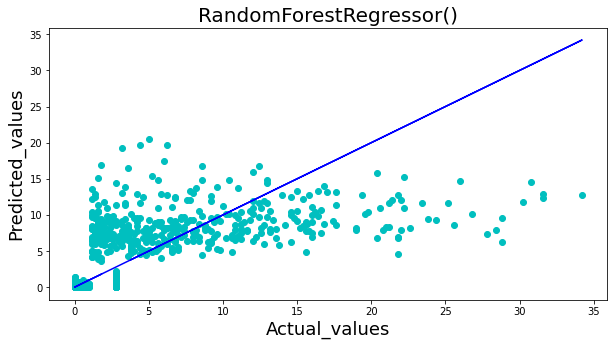

In [876]:
best_model.final_model(x1, y1, model, 174)

In [872]:
best_model.cross_val_score(model, x1, y1)

cross_val_score 47.461868180250946 at cv = 2 

cross_val_score 46.90532192011413 at cv = 3 

cross_val_score 48.48503887970549 at cv = 4 

cross_val_score 48.82927199695704 at cv = 5 

cross_val_score 47.90400689381259 at cv = 6 

cross_val_score 48.15790363698496 at cv = 7 

cross_val_score 49.130529287353234 at cv = 8 

cross_val_score 47.841978803840874 at cv = 9 



## Model 2 LGBMRegressor

In [890]:
model = LGBMRegressor()

In [878]:
# best_model.best_fit(x1, y1, model)  #finding best random state

# no random state found

In [879]:
for i in random.sample(range(1, 200), 20):
    x_train, x_test, y_train, y_test = train_test_split(x1, y1, random_state = i, test_size = 0.30)
    model.fit(x_train, y_train)
    pred_train = model.predict(x_train)
    pred_test = model.predict(x_test)
    training = r2_score(pred_train, y_train)
    testing = r2_score(pred_test, y_test)
            
    #if np.abs(round(training, 2) - round(testing, 2)) < 0.01:
                
    print("At random_state:-", i)
    print("Training accuracy_score is:-", r2_score(pred_train, y_train)*100)
    print("Testing accuracy_score is:-", r2_score(pred_test, y_test)*100)
    print("\n")

At random_state:- 45
Training accuracy_score is:- 84.4176383296241
Testing accuracy_score is:- 22.646956966246602


At random_state:- 193
Training accuracy_score is:- 85.40379933878476
Testing accuracy_score is:- 13.61330411043513


At random_state:- 7
Training accuracy_score is:- 86.06083597230922
Testing accuracy_score is:- -0.9171684896951859


At random_state:- 13
Training accuracy_score is:- 84.73120236257986
Testing accuracy_score is:- 10.36686215149899


At random_state:- 149
Training accuracy_score is:- 85.76601281238435
Testing accuracy_score is:- 9.167234682573655


At random_state:- 18
Training accuracy_score is:- 86.87038579432583
Testing accuracy_score is:- 4.356661272225237


At random_state:- 80
Training accuracy_score is:- 85.51581655592771
Testing accuracy_score is:- 6.7153906457954164


At random_state:- 44
Training accuracy_score is:- 84.84494470131665
Testing accuracy_score is:- 20.710530418922968


At random_state:- 69
Training accuracy_score is:- 87.23296295419483

#### Model giving best testing r2 score at 174

At random state 174 model giving best accuracy score 

Training accuracy:-  84.66582392462816
Testing accuracy:-  31.812988758504613


--------------------------------------
Mean squared error:-  9.777736156894552
Mean absolute error:-  1.309326707454668
Root Mean squared error:- 3.1269371846736145


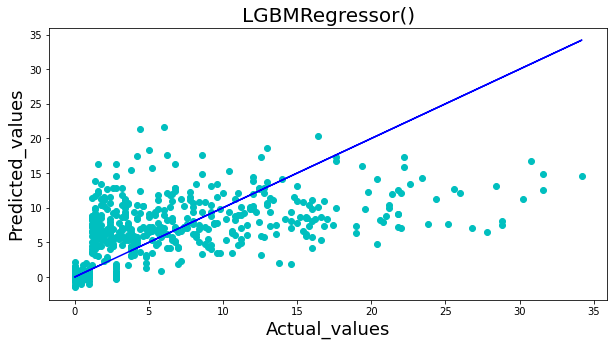

In [880]:
best_model.final_model(x1, y1, model, 174)

In [891]:
best_model.cross_val_score(model, x1, y1)

cross_val_score 42.88170990418656 at cv = 2 

cross_val_score 44.45747037995581 at cv = 3 

cross_val_score 44.45021761904545 at cv = 4 

cross_val_score 45.929113289359336 at cv = 5 

cross_val_score 45.130164067715945 at cv = 6 

cross_val_score 47.24688169813215 at cv = 7 

cross_val_score 47.74506256145088 at cv = 8 

cross_val_score 46.251567782693634 at cv = 9 



## Model 3 AdaBoostRegressor

In [881]:
model = AdaBoostRegressor()

In [882]:
best_model.best_fit(x1, y1, model)  #finding best random state

At random_state:- 12
Training accuracy_score is:- 40.53661527279908
Testing accuracy_score is:- 39.80728841504894


At random_state:- 42
Training accuracy_score is:- 38.064735806933214
Testing accuracy_score is:- 38.17268457301891


At random_state:- 43
Training accuracy_score is:- 36.499886607850115
Testing accuracy_score is:- 35.948486057014485


At random_state:- 70
Training accuracy_score is:- 41.492977941842966
Testing accuracy_score is:- 40.556029176828254


At random_state:- 81
Training accuracy_score is:- 38.263808832876954
Testing accuracy_score is:- 37.59492035492301


At random_state:- 82
Training accuracy_score is:- 41.07685404240482
Testing accuracy_score is:- 40.18695538789151


At random_state:- 91
Training accuracy_score is:- 41.084401068096575
Testing accuracy_score is:- 39.991614628556135


At random_state:- 97
Training accuracy_score is:- 39.514019957910016
Testing accuracy_score is:- 39.96116223173575


At random_state:- 128
Training accuracy_score is:- 40.691887470

#### Model gives best r2 score at 185

At random state 185 model giving best accuracy score 

Training accuracy:-  42.25089095448633
Testing accuracy:-  42.15448326130849


--------------------------------------
Mean squared error:-  13.82531498046623
Mean absolute error:-  1.668428850543931
Root Mean squared error:- 3.7182408448708952


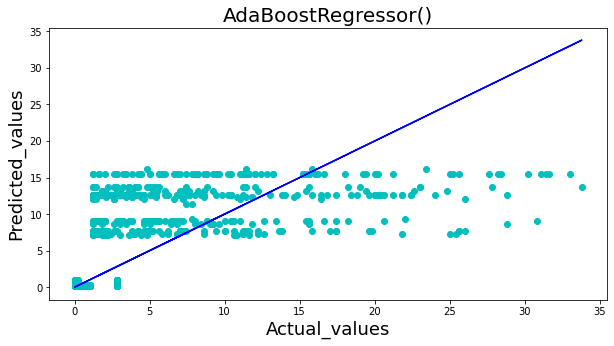

In [885]:
best_model.final_model(x1, y1, model, 185)

In [848]:
best_model.cross_val_score(model, x1, y1)

cross_val_score 38.469522488332125 at cv = 2 

cross_val_score 40.723854178476856 at cv = 3 

cross_val_score 40.627366125447736 at cv = 4 

cross_val_score 39.98763873712402 at cv = 5 

cross_val_score 39.81628195218605 at cv = 6 

cross_val_score 41.48369998441913 at cv = 7 

cross_val_score 40.38135596768797 at cv = 8 

cross_val_score 38.02054153518413 at cv = 9 



## Model 4 ExtraTreesRegressor

In [892]:
model = ExtraTreesRegressor()

In [887]:
# best_model.best_fit(x1, y1, model)  #finding best random state

# no random state found

In [888]:
for i in random.sample(range(1, 200), 20):
    x_train, x_test, y_train, y_test = train_test_split(x1, y1, random_state = i, test_size = 0.30)
    model.fit(x_train, y_train)
    pred_train = model.predict(x_train)
    pred_test = model.predict(x_test)
    training = r2_score(pred_train, y_train)
    testing = r2_score(pred_test, y_test)
            
    #if np.abs(round(training, 2) - round(testing, 2)) < 0.01:
                
    print("At random_state:-", i)
    print("Training accuracy_score is:-", r2_score(pred_train, y_train)*100)
    print("Testing accuracy_score is:-", r2_score(pred_test, y_test)*100)
    print("\n")

At random_state:- 46
Training accuracy_score is:- 99.89819210961736
Testing accuracy_score is:- 25.021032704055703


At random_state:- 156
Training accuracy_score is:- 100.0
Testing accuracy_score is:- 25.898708087814327


At random_state:- 7
Training accuracy_score is:- 99.88942223492458
Testing accuracy_score is:- 7.979731837647675


At random_state:- 40
Training accuracy_score is:- 100.0
Testing accuracy_score is:- 17.178973293942


At random_state:- 50
Training accuracy_score is:- 99.89539121197078
Testing accuracy_score is:- 14.405316484999354


At random_state:- 47
Training accuracy_score is:- 100.0
Testing accuracy_score is:- 18.936691556232034


At random_state:- 61
Training accuracy_score is:- 100.0
Testing accuracy_score is:- 12.097959755269482


At random_state:- 30
Training accuracy_score is:- 99.90226882383428
Testing accuracy_score is:- 28.258738763700787


At random_state:- 115
Training accuracy_score is:- 99.89929919873153
Testing accuracy_score is:- 24.807859560195176


#### Model giving best testing r2 score at 156

At random state 156 model giving best accuracy score 

Training accuracy:-  100.0
Testing accuracy:-  25.743312413370433


--------------------------------------
Mean squared error:-  10.91282348277767
Mean absolute error:-  1.3683192765602727
Root Mean squared error:- 3.3034562934565472


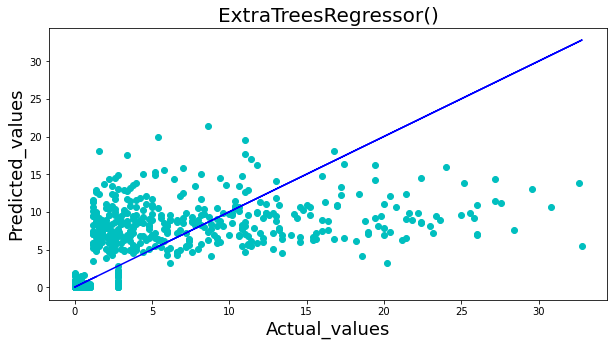

In [889]:
best_model.final_model(x1, y1, model, 156)

In [894]:
best_model.cross_val_score(model, x1, y1)

cross_val_score 48.07276311657657 at cv = 2 

cross_val_score 46.96953696613318 at cv = 3 

cross_val_score 48.39443692666991 at cv = 4 

cross_val_score 48.967182570534646 at cv = 5 

cross_val_score 47.46177065478129 at cv = 6 

cross_val_score 49.1974450051955 at cv = 7 

cross_val_score 48.877357961469805 at cv = 8 

cross_val_score 47.64302654979555 at cv = 9 



### Finalizing Model

In [895]:
# models                    R2_score_train_score    R2_score_test_score      CV score            CV_state

# RandomForestRegressor     89.42792869718707       32.359595058622105      46.90532192011413      3     
# LGBMRegressor             84.66582392462816       31.812988758504613      42.88170990418656      2
# AdaBoostRegressor         42.25089095448633       42.15448326130849       41.48369998441913      7
# ExtraTreesRegressor       100.00                  25.743312413370433      46.96953696613318      6

### Observations:
- From above 4 models we find that all the models are underfitted as training and testing r2score are not matched except.

- AdaBoostRegressor shows similar training and testing r2score also showing good score rather than other models hence we are going to consider it for model building.
    

### Final Model selected as  AdaBoostRegressor

### Ensemble Technique

## Hyper Parameter Tuning

In [896]:
# using hyper parameter tuning for Support Vector Classifier to find out best criterion

model = AdaBoostRegressor()

#default params: base_estimator=None,
#     n_estimators=50,
#    learning_rate=1.0,
#    loss='linear'


param = {'base_estimator' : [DecisionTreeRegressor(), None], 
             'learning_rate' : [0.1, 0.01, 1],
             'loss' : ['linear','square', 'exponential']
            'n_estimators': [50,100,150]}

gd = GridSearchCV(model, param_grid=param, cv = 7)
gd.fit(x, y)
gd.best_params_
#{'base_estimator': None, 'learning_rate': 0.1, 'loss': 'linear', 'n_estimators':50}

{'base_estimator': None, 'learning_rate': 0.1, 'loss': 'linear'}

In [942]:
final_model = AdaBoostRegressor(base_estimator=None, learning_rate=0.1, loss = 'linear')

In [927]:
best_model.best_fit(x1, y1, final_model)  # finding best fit random state after hyper parameter tuning

At random_state:- 8
Training accuracy_score is:- 41.14698542636961
Testing accuracy_score is:- 39.684986265868616


At random_state:- 13
Training accuracy_score is:- 40.43900066723884
Testing accuracy_score is:- 39.7144504885243


At random_state:- 42
Training accuracy_score is:- 39.609360876316416
Testing accuracy_score is:- 39.56647949873512


At random_state:- 50
Training accuracy_score is:- 37.61129799715892
Testing accuracy_score is:- 37.60069495196121


At random_state:- 55
Training accuracy_score is:- 36.40560762910331
Testing accuracy_score is:- 35.901509648553066


At random_state:- 59
Training accuracy_score is:- 41.397229029795405
Testing accuracy_score is:- 41.25286076126523


At random_state:- 70
Training accuracy_score is:- 43.368914318555206
Testing accuracy_score is:- 42.638311860509894


At random_state:- 89
Training accuracy_score is:- 40.26159342193939
Testing accuracy_score is:- 40.30532243377613


At random_state:- 97
Training accuracy_score is:- 40.41791456388971


#### At random state 59 model giving best r2 score

At random state 59 model giving best accuracy score 

Training accuracy:-  40.20315161578186
Testing accuracy:-  40.497907227964326


--------------------------------------
Mean squared error:-  13.634746079682964
Mean absolute error:-  1.6770071656420598
Root Mean squared error:- 3.6925257046746425


Text(0.5, 1.0, 'AdaBoostRegressor()')

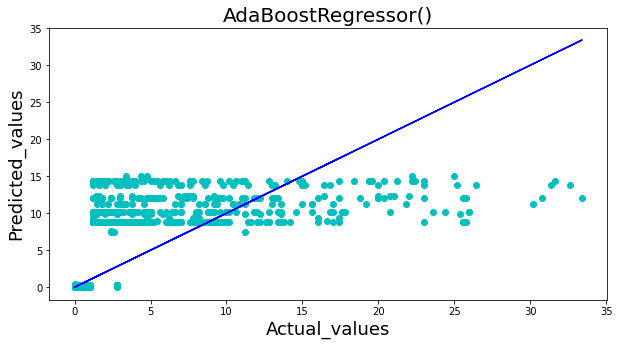

In [931]:
x_train, x_test, y_train, y_test = train_test_split(x1, y1, test_size = 0.30, random_state = 59)
final_model.fit(x_train, y_train)
pred_train = final_model.predict(x_train)
pred_test = final_model.predict(x_test)
print("At random state", 59 , "model giving best accuracy score","\n")
Train_accuracy = r2_score(pred_train, y_train)
Test_accuracy = r2_score(pred_test, y_test)

print('Training accuracy:- ', Train_accuracy*100)
print('Testing accuracy:- ', Test_accuracy*100)
print("\n")
print('--------------------------------------')
print('Mean squared error:- ', mean_squared_error(pred_test, y_test) )
print('Mean absolute error:- ', mean_absolute_error(pred_test, y_test) )
print('Root Mean squared error:-',np.sqrt(mean_squared_error(pred_test, y_test)))
        
plt.figure(figsize = (10, 5))
plt.scatter(x = y_test, y = pred_test, color = 'c')
plt.plot(y_test, y_test, color = 'b')
plt.xlabel('Actual_values', fontsize= 18 )
plt.ylabel('Predicted_values', fontsize = 18)
plt.title(str(model), fontsize = 20)

### Cross Val Score

In [941]:
cv = cross_val_score(final_model, x1, y1, cv = 7).mean()
print('Cross Val Score-' , cv*100)

Cross Val Score- 40.17771540103844


### Deploy Model

In [947]:
import pickle

filename = "Rainfall.pkl"
pickle.dump(final_model, open(filename, 'wb'))

### Loading Model

In [948]:
load = pickle.load(open('Rainfall.pkl', 'rb'))
result = load.score(x_test, y_test)
print(result)

0.4604860337044552


### Conclusion

In [949]:
conclusion = pd.DataFrame()
conclusion['Predicted Rainfall'] = np.array(final_model.predict(x_test))
conclusion['Actual Rainfall'] = np.array(y_test)

In [951]:
conclusion.sample(10)

,Predicted Rainfall,Actual Rainfall
636,0.133376,0.0
1573,0.209923,0.0
397,14.458621,20.0
873,0.041616,0.0
1400,0.035650,0.0
1615,9.697978,5.0
1832,0.035650,0.0
1271,8.792727,7.8
980,8.290495,6.2
888,0.108800,0.6
